In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import sys
sys.path.append("/home/niaki/Projects/inpynting")
np.set_printoptions(threshold=sys.maxsize)

In [3]:
try:
    nodes_descr_storedhalves = pickle.load(open("/home/niaki/Downloads/nodes_descr_storedhalves.pickle", "rb"))
except Exception as e:
    print("Problem while trying to unpickle: ", str(e))

In [6]:
nodes_descr_storedhalves

{3640: <data_structures.Node at 0x7f2655440518>,
 3648: <data_structures.Node at 0x7f2654691400>,
 3656: <data_structures.Node at 0x7f2654671b00>,
 3664: <data_structures.Node at 0x7f26548e9f28>,
 3672: <data_structures.Node at 0x7f26548e9fd0>,
 3680: <data_structures.Node at 0x7f26548fc080>,
 3688: <data_structures.Node at 0x7f2663b6a470>,
 3696: <data_structures.Node at 0x7f26796ed240>,
 3704: <data_structures.Node at 0x7f26796ed668>,
 3712: <data_structures.Node at 0x7f2654806080>,
 3720: <data_structures.Node at 0x7f26780c5588>,
 3728: <data_structures.Node at 0x7f267968df28>,
 4520: <data_structures.Node at 0x7f267968df60>,
 4528: <data_structures.Node at 0x7f267968d828>,
 4536: <data_structures.Node at 0x7f267968dbe0>,
 4544: <data_structures.Node at 0x7f267968da20>,
 4552: <data_structures.Node at 0x7f267968db70>,
 4560: <data_structures.Node at 0x7f267968dc50>,
 4568: <data_structures.Node at 0x7f267968d908>,
 4576: <data_structures.Node at 0x7f267968dc18>,
 4584: <data_structu

1


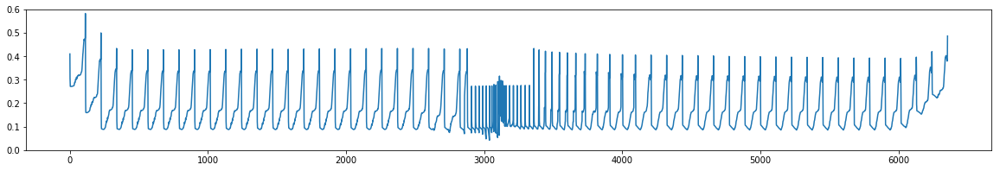

2


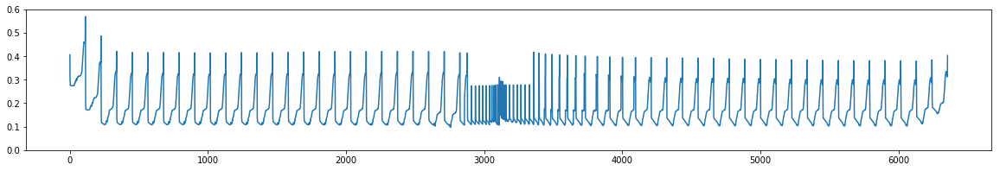

3


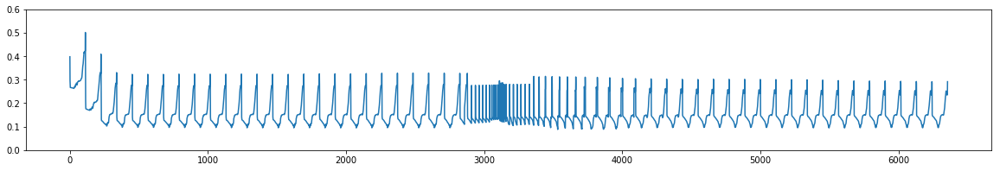

4


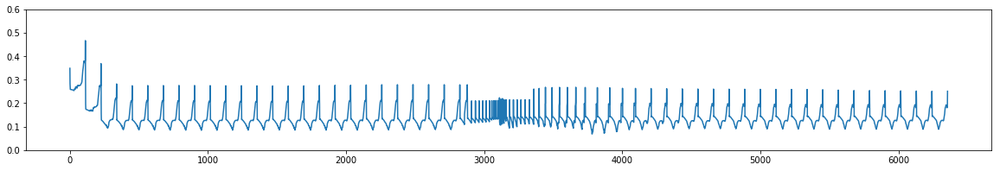

5


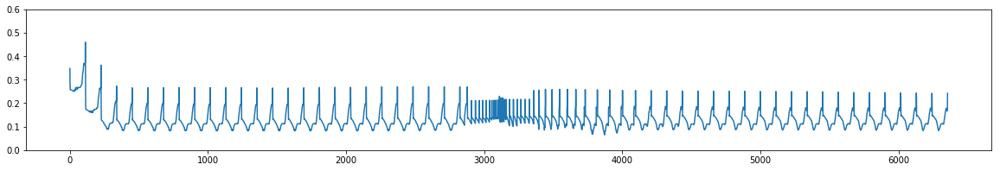

6


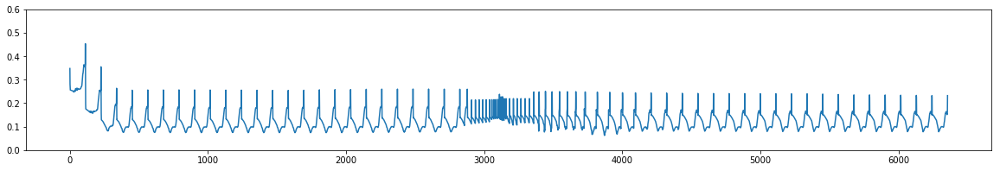

7


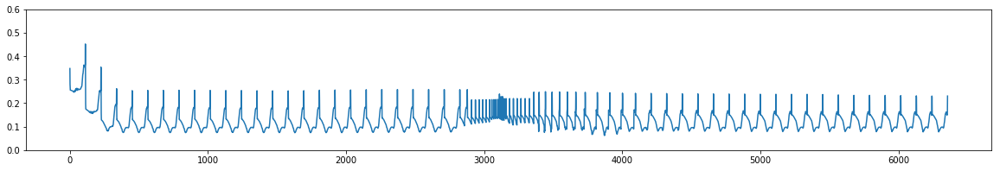

8


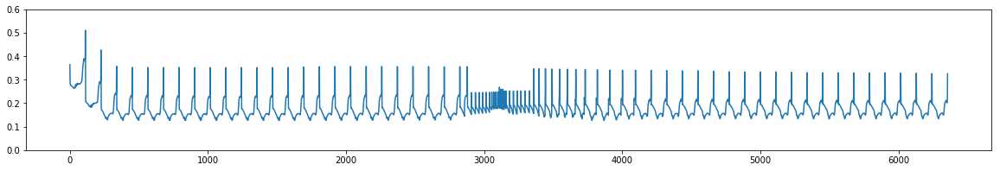

9


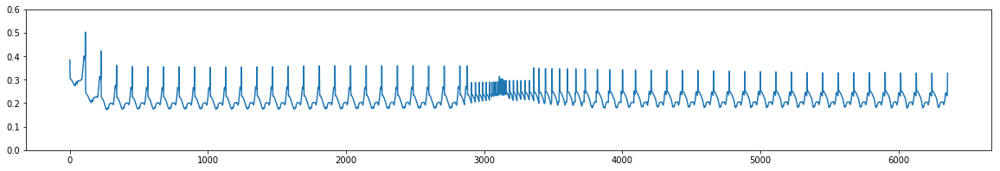

10


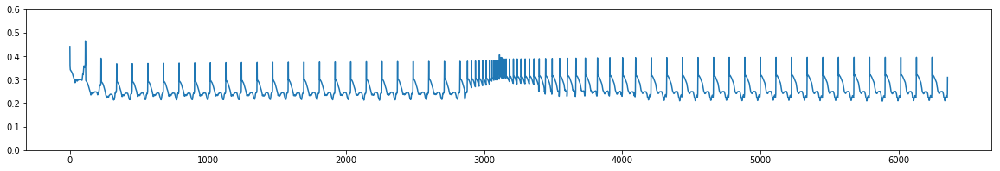

11


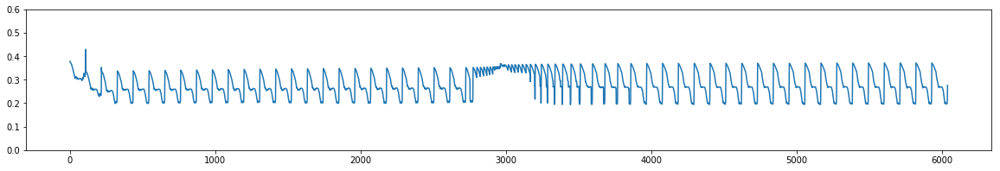

12


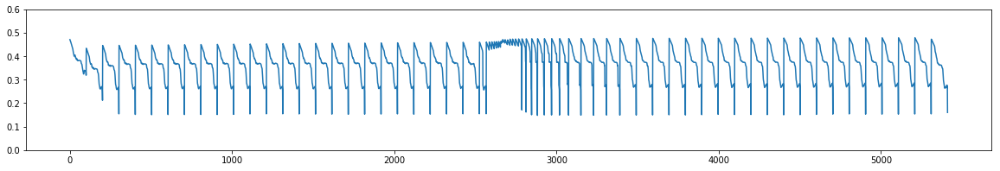

13


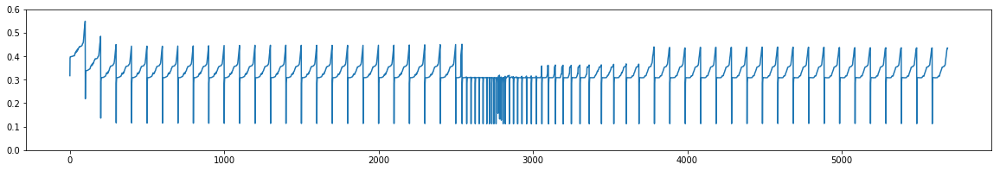

14


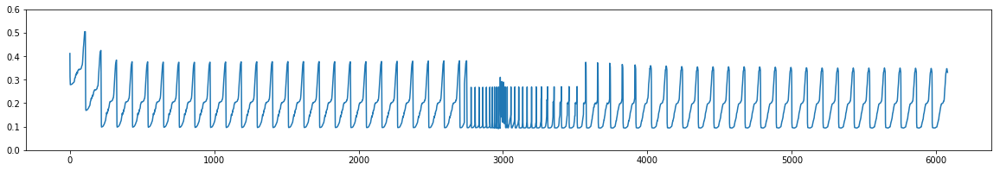

15


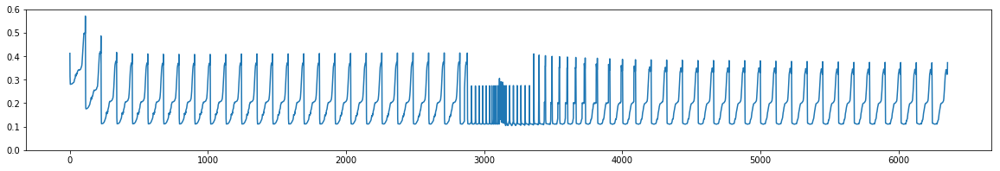

16


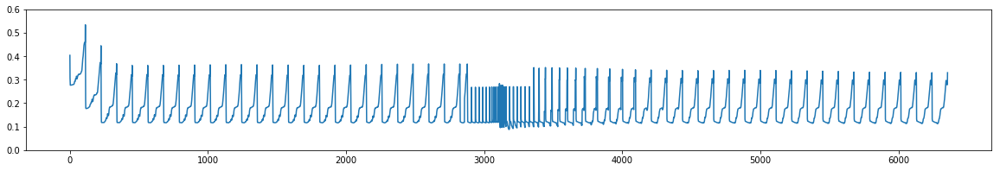

17


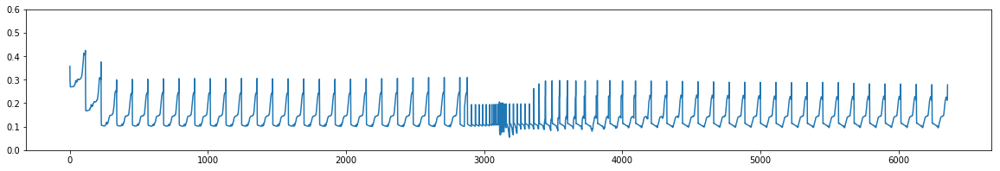

18


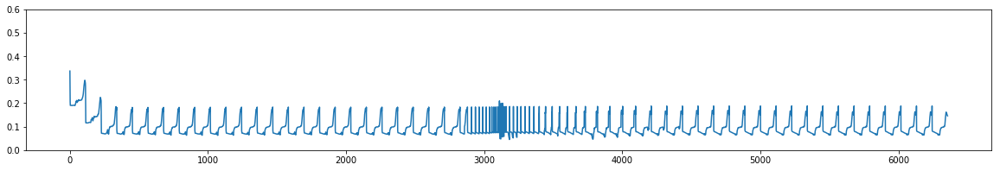

19


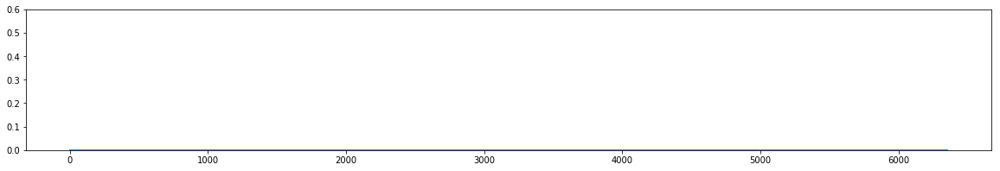

20


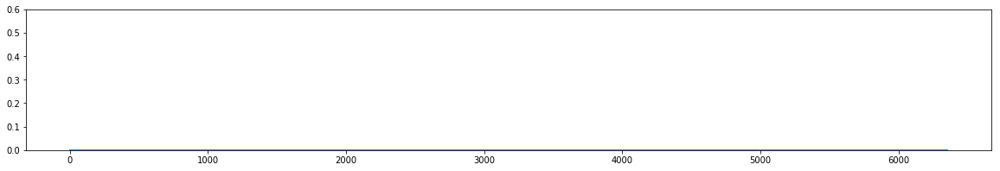

21


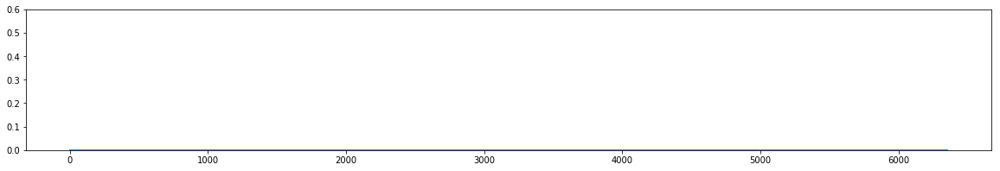

22


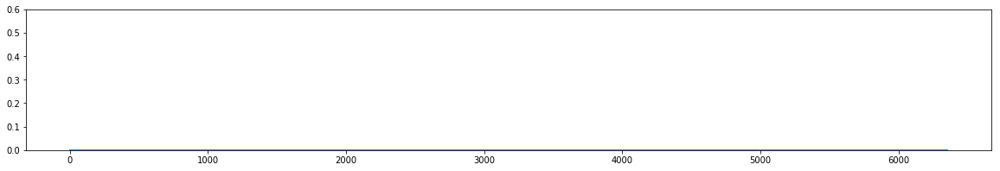

23


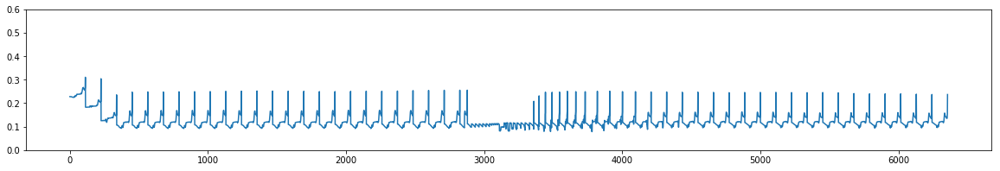

24


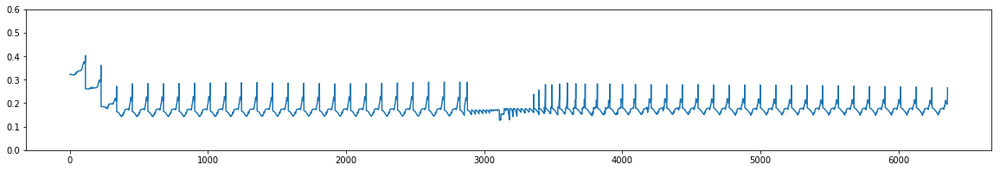

25


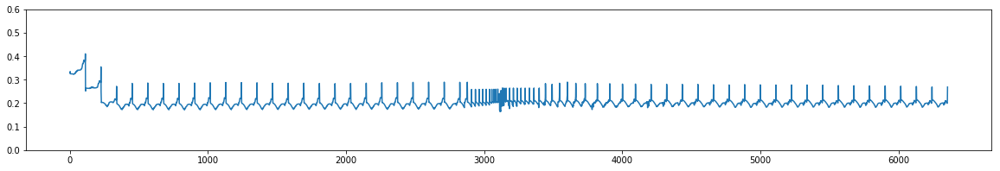

26


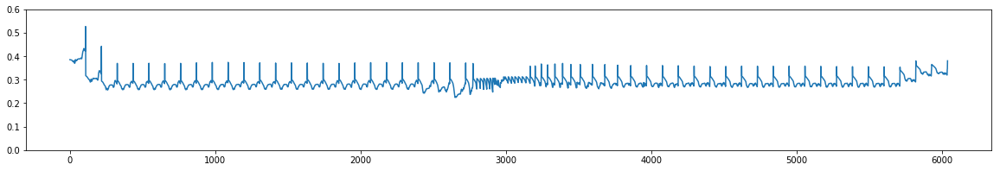

27


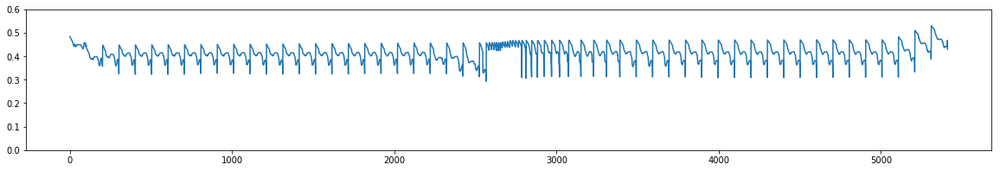

28


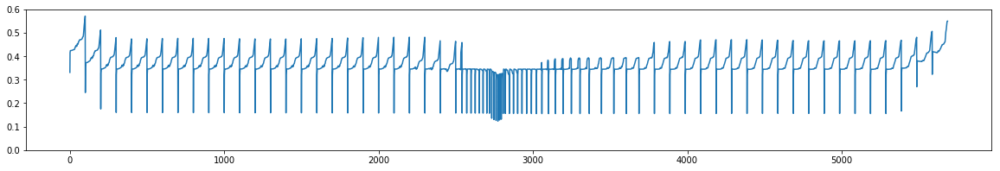

29


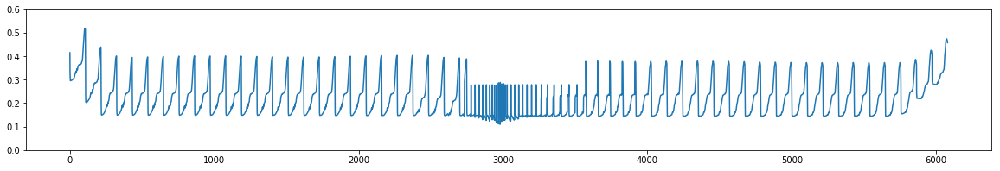

30


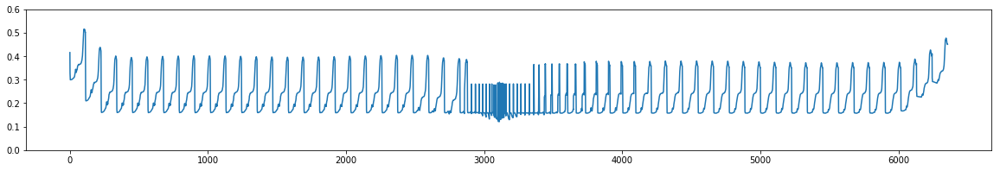

31


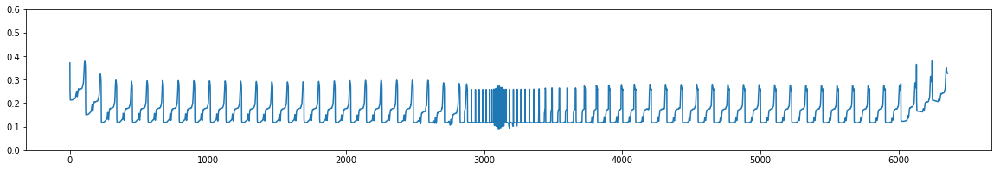

32


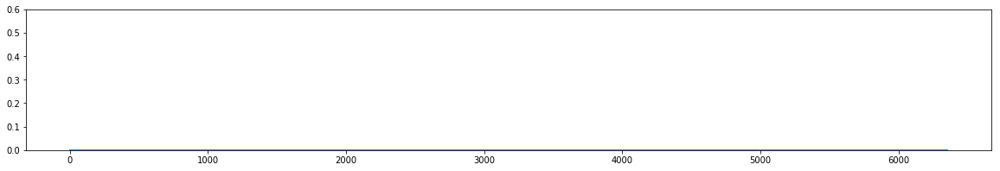

33


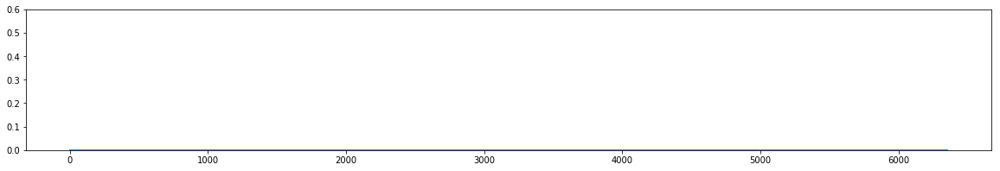

34


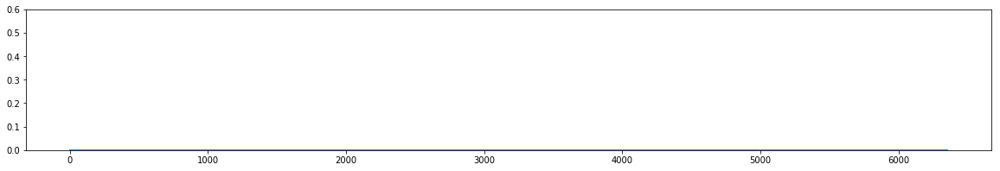

35


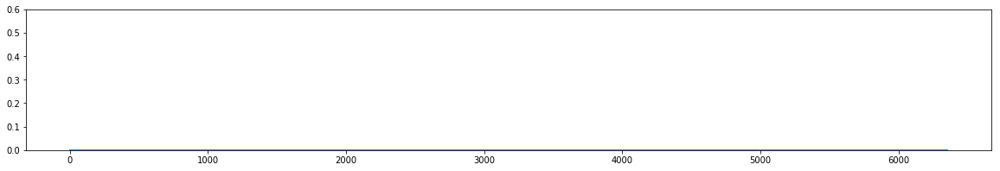

36


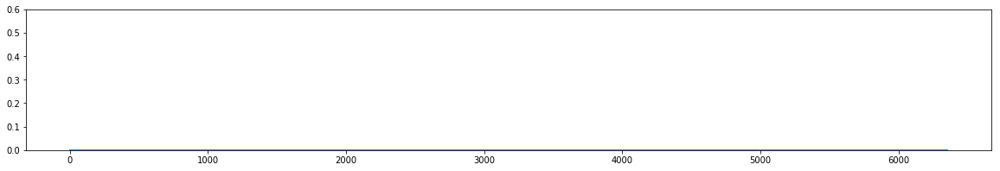

37


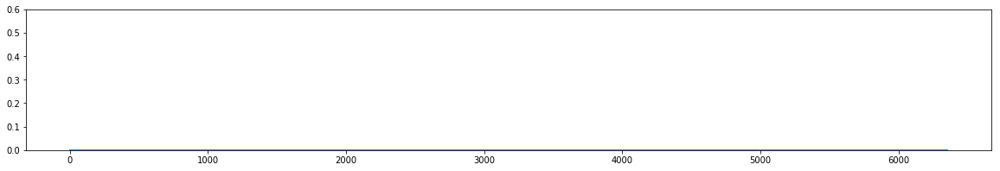

38


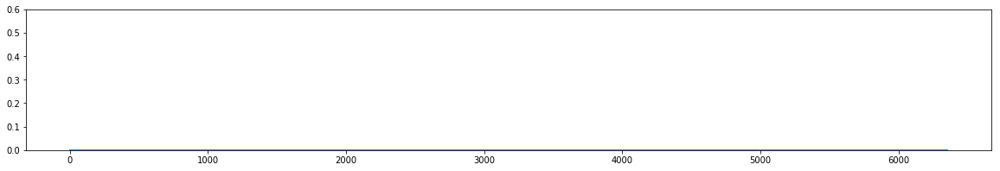

39


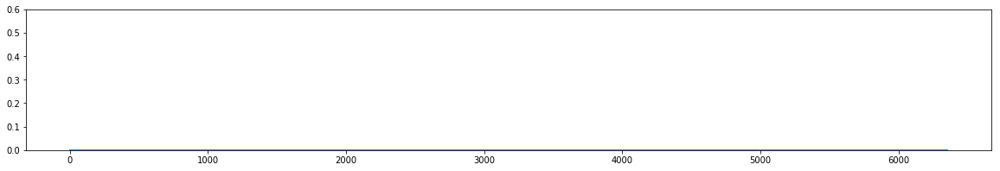

40


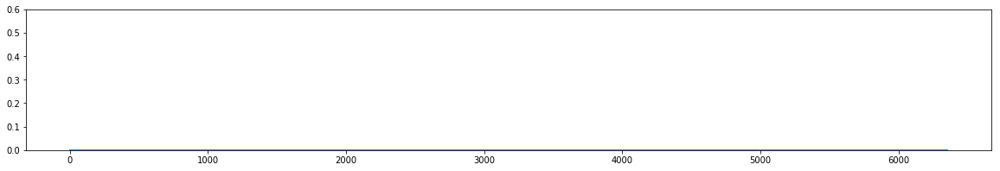

41


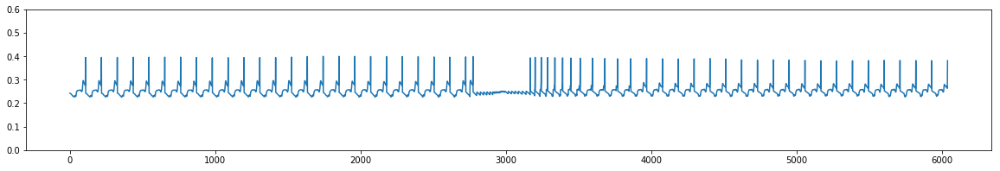

42


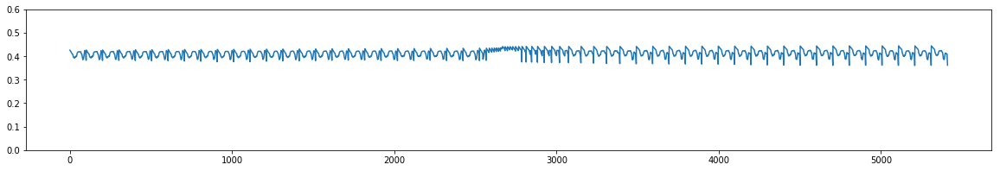

43


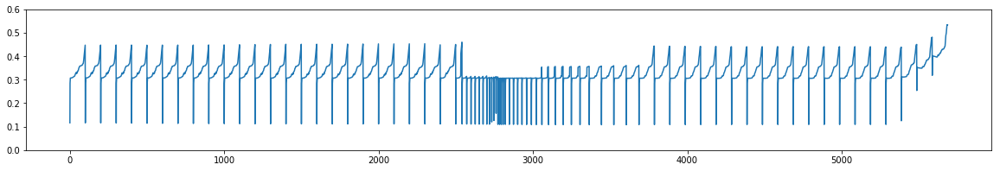

44


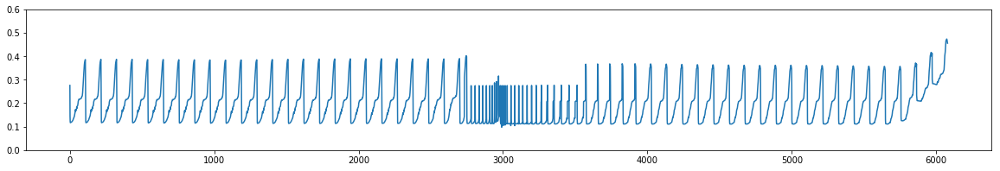

45


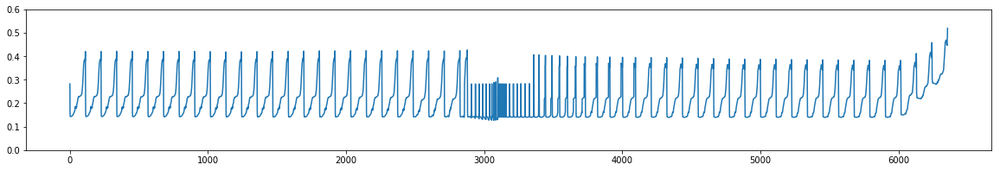

46


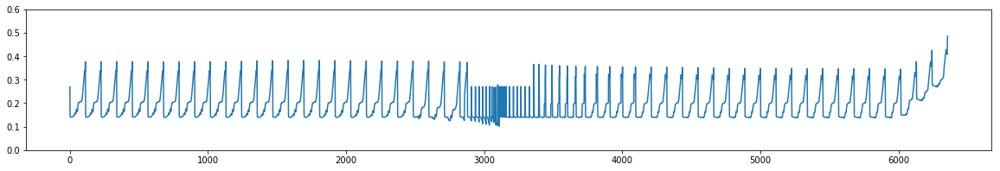

47


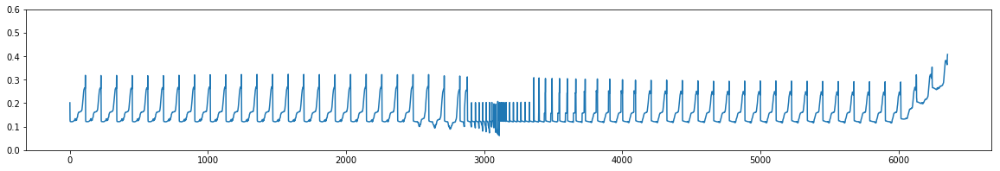

48


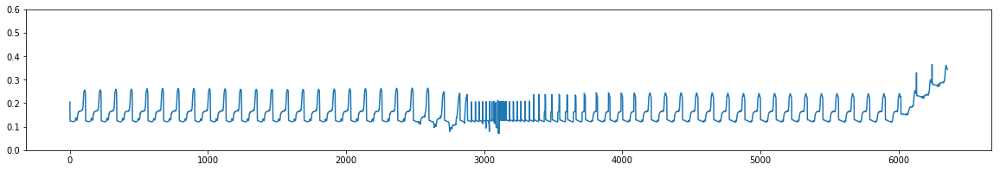

49


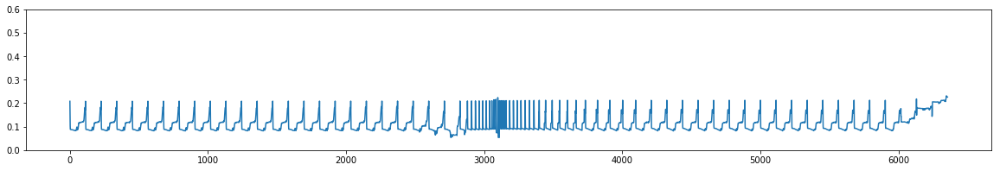

50


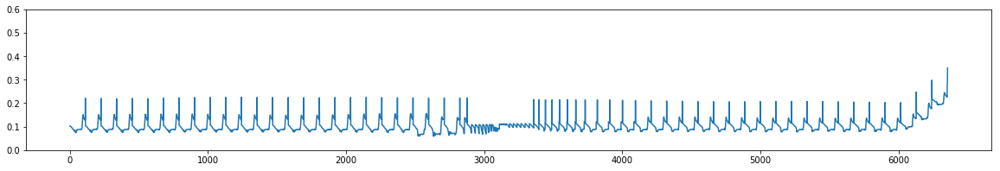

51


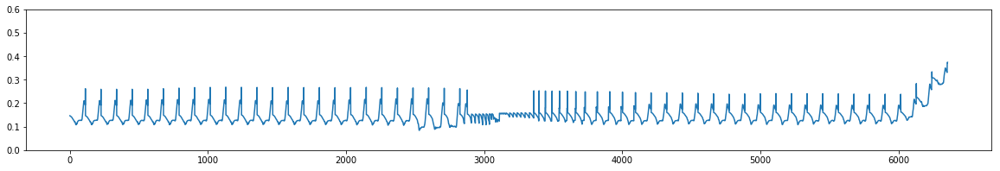

52


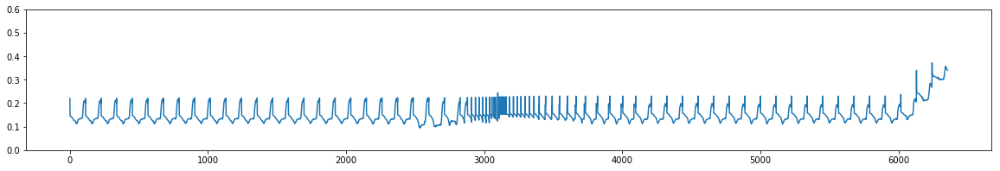

53


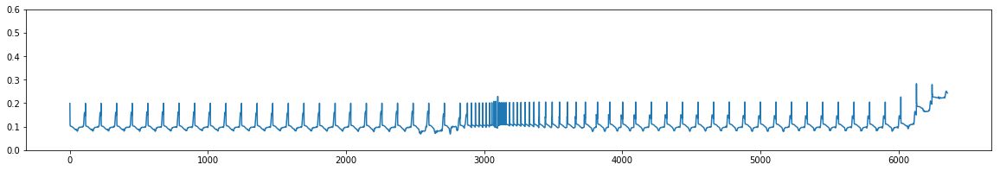

54


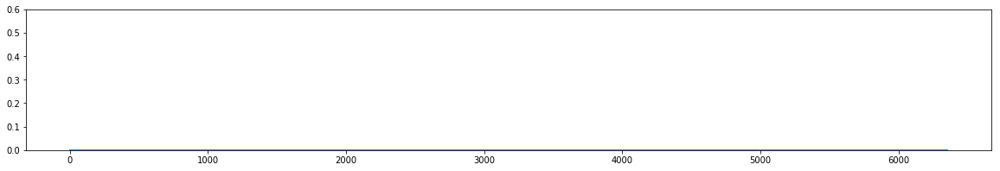

55


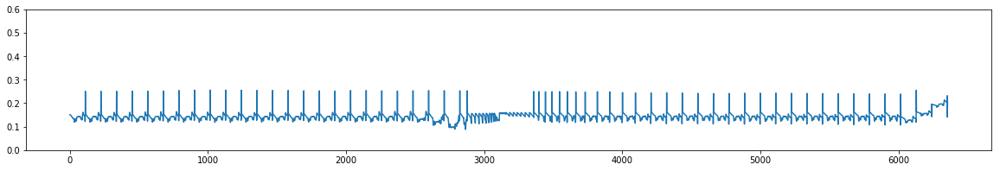

56


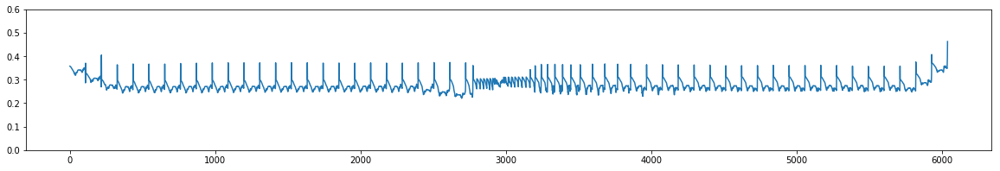

57


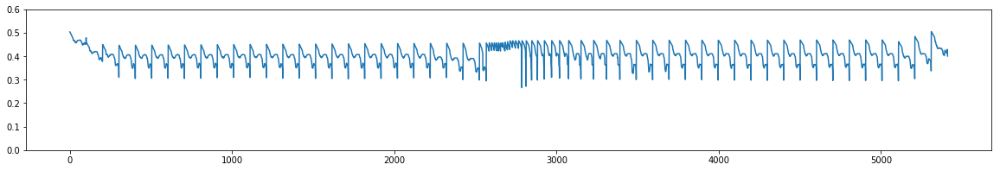

58


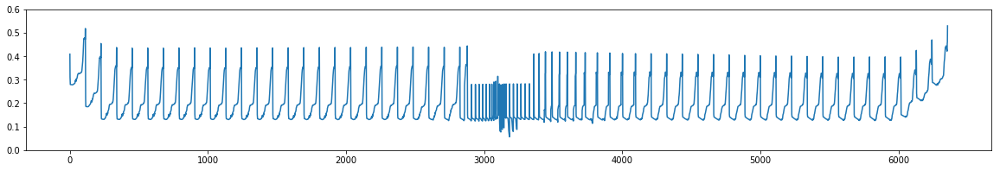

59


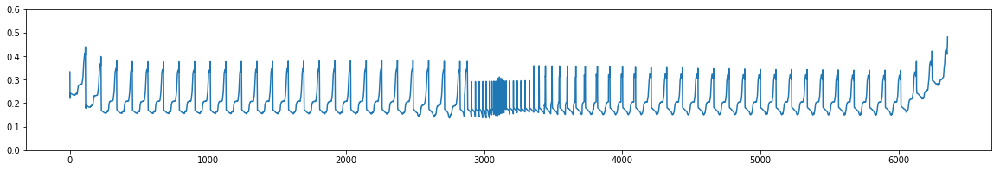

60


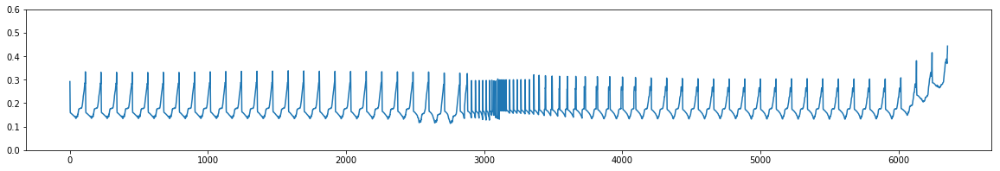

61


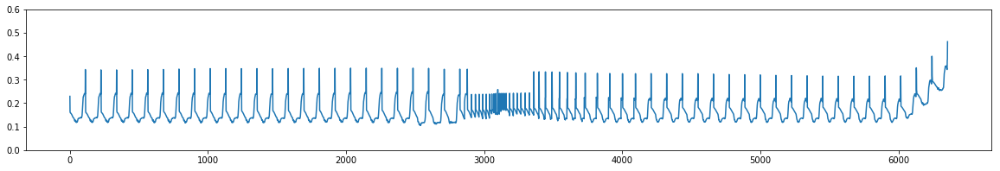

62


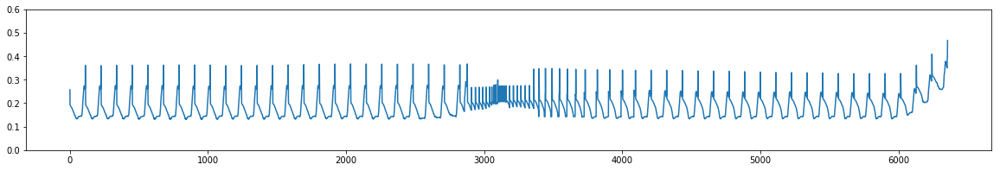

63


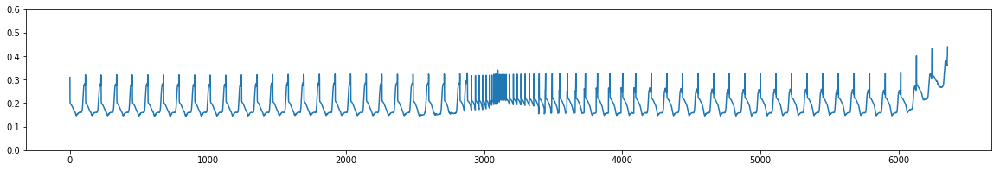

64


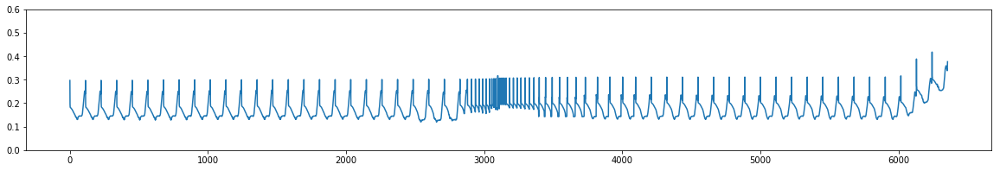

65


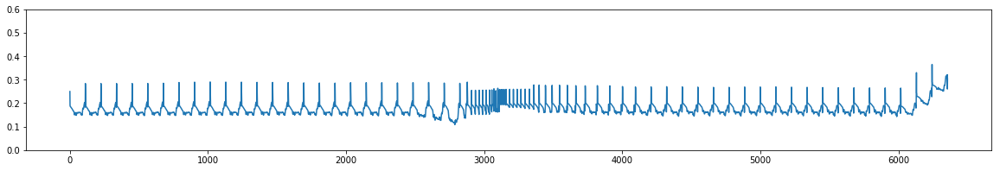

66


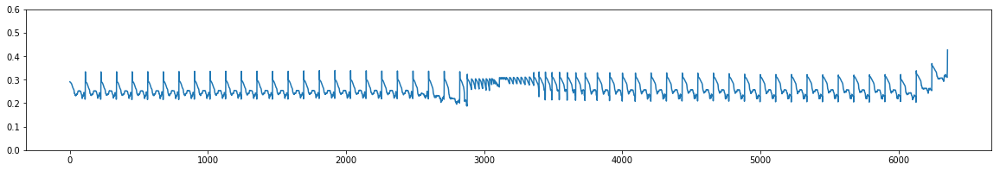

67


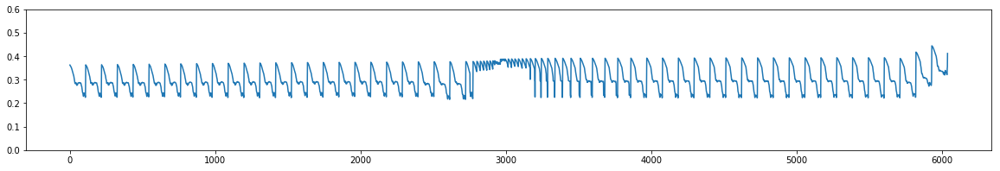

68


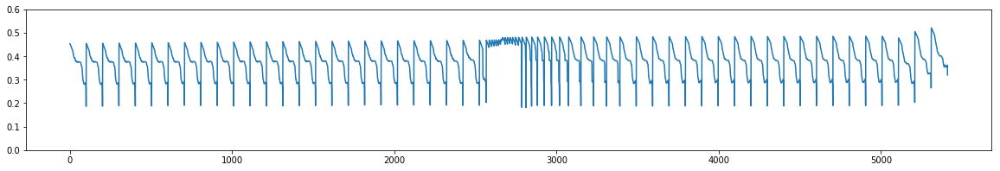

69


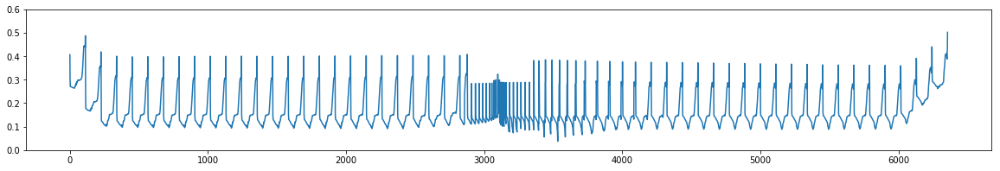

70


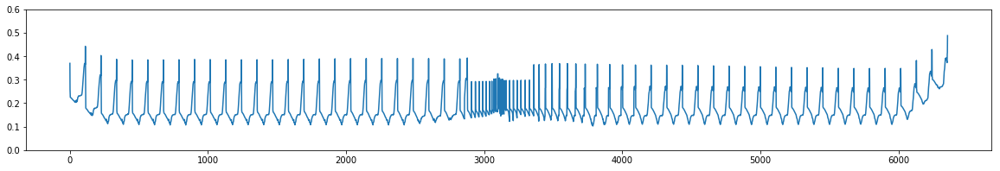

71


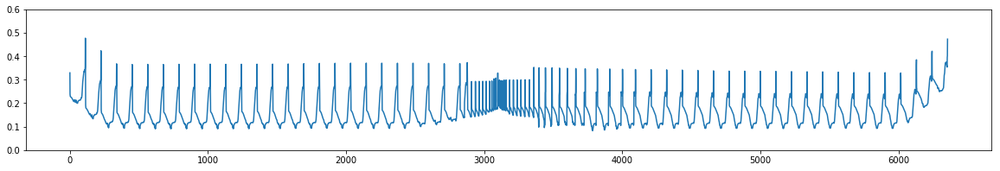

72


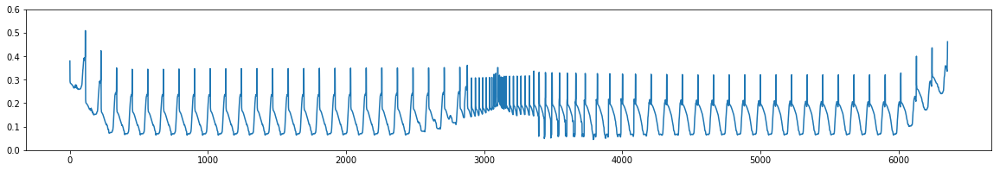

73


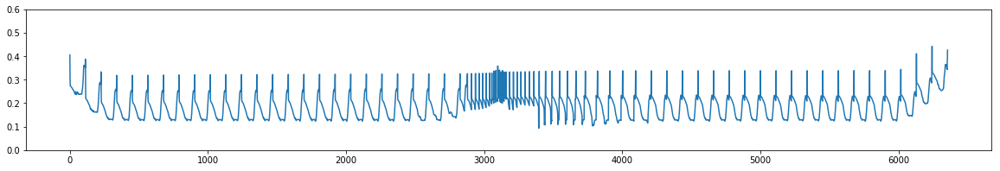

74


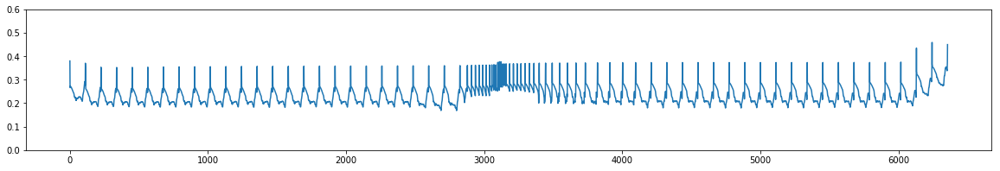

75


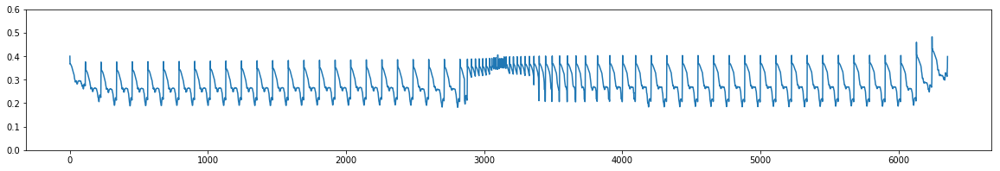

76


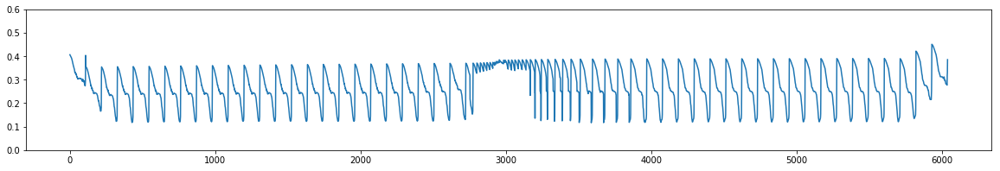

77


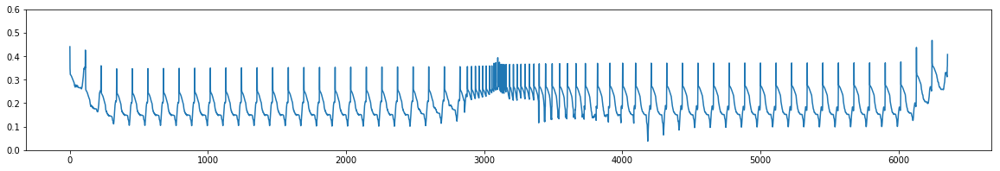

78


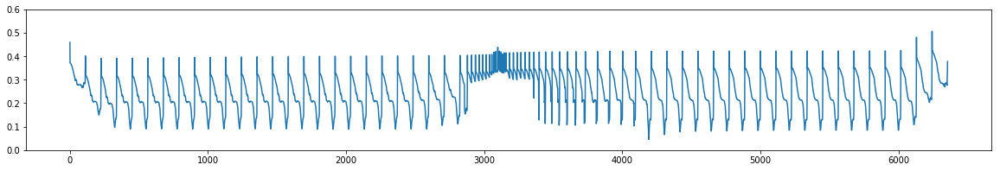

In [33]:
counter = 1
plt.rcParams["figure.figsize"] = (20,3)
for key in nodes_descr_storedhalves.keys():
    print(counter)
    plt.plot(nodes_descr_storedhalves[key].differences.values())
#     plt.xlim((2800,3400))
    plt.ylim((0,0.6))
    plt.show()
    counter += 1

In [4]:
try:
    nodes_rgb = pickle.load(open("/home/niaki/Downloads/nodes_rgb.pickle", "rb"))
except Exception as e:
    print("Problem while trying to unpickle: ", str(e))

1


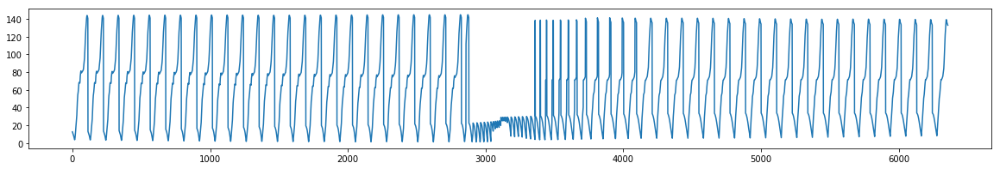

2


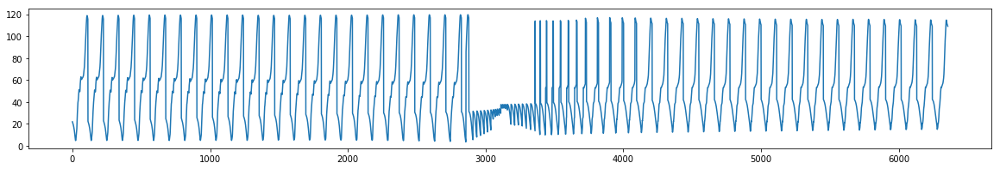

3


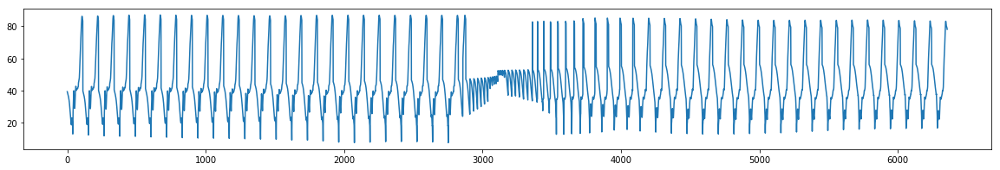

4


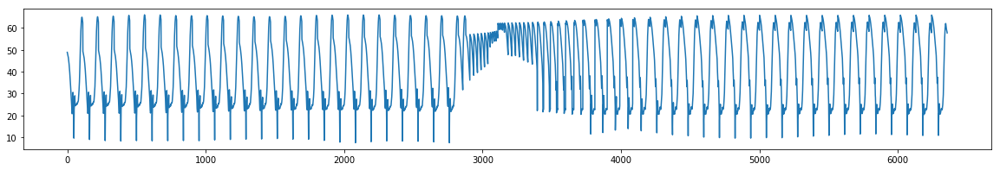

5


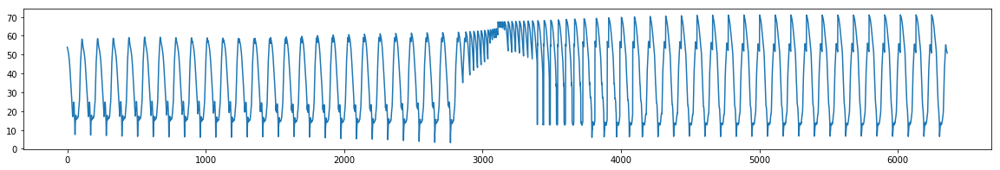

6


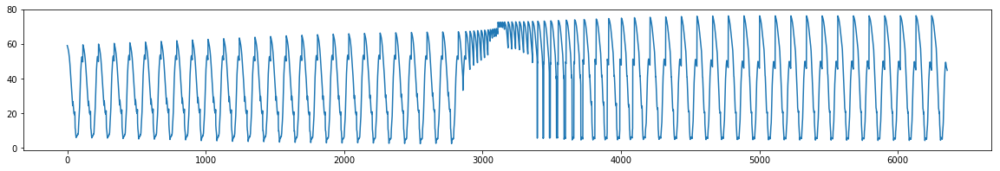

7


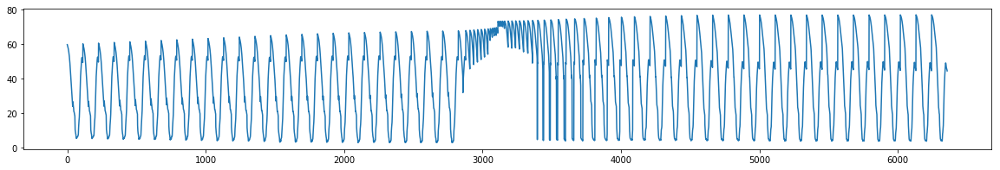

8


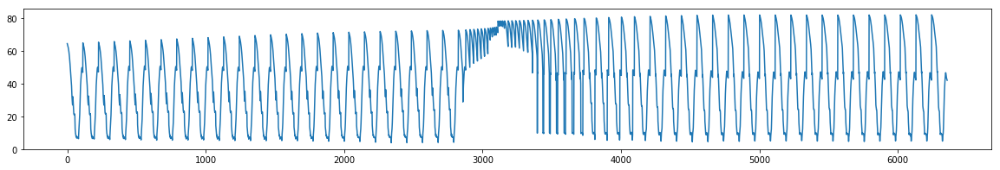

9


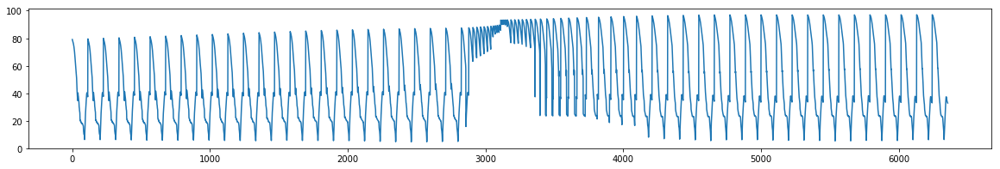

10


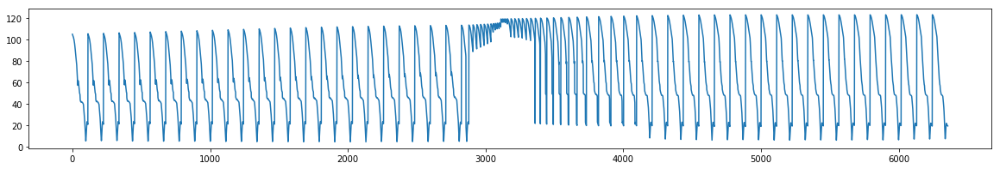

11


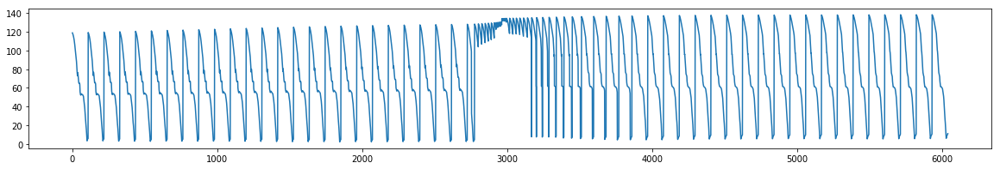

12


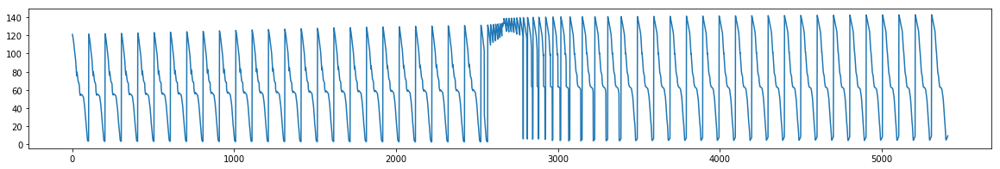

13


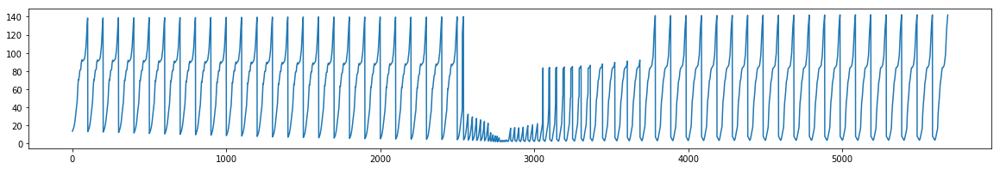

14


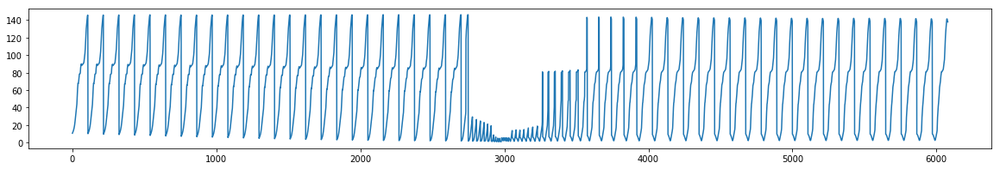

15


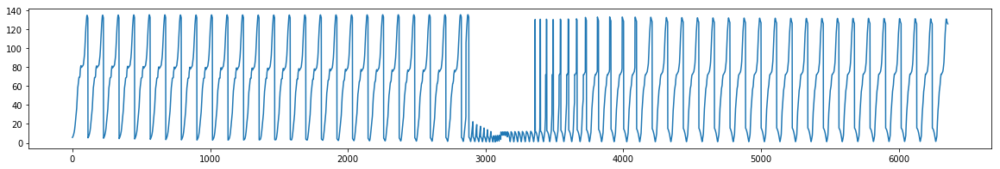

16


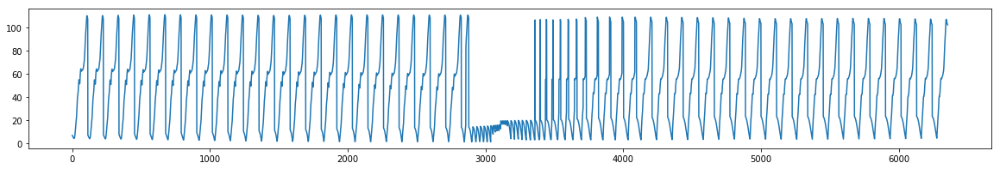

17


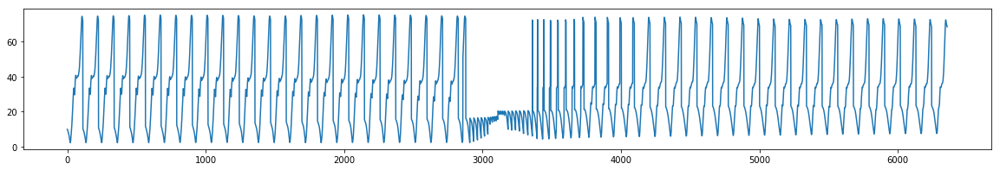

18


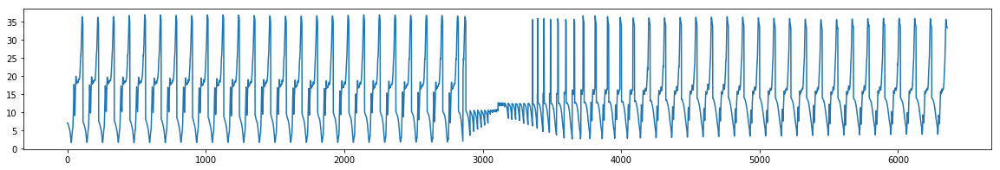

19


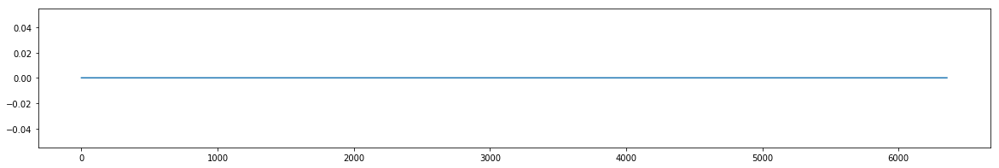

20


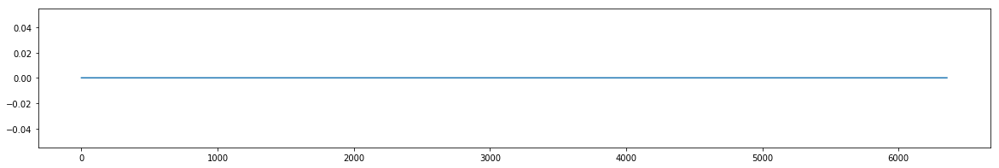

21


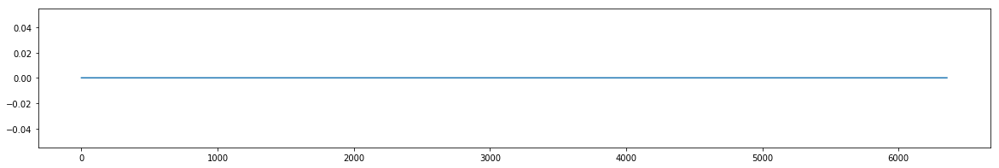

22


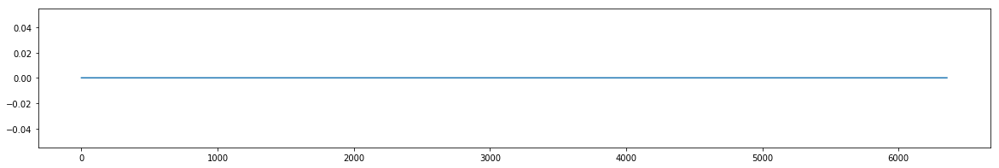

23


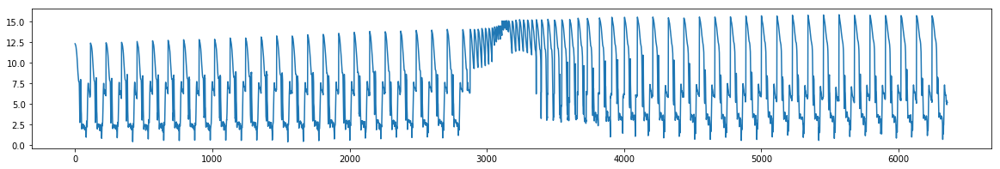

24


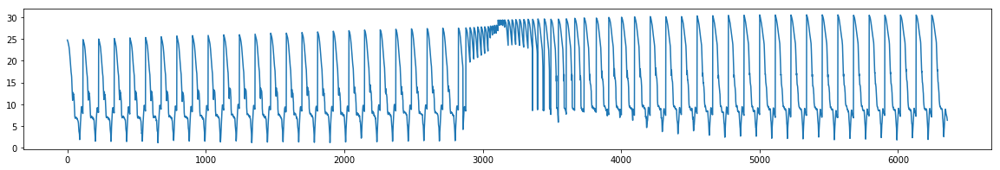

25


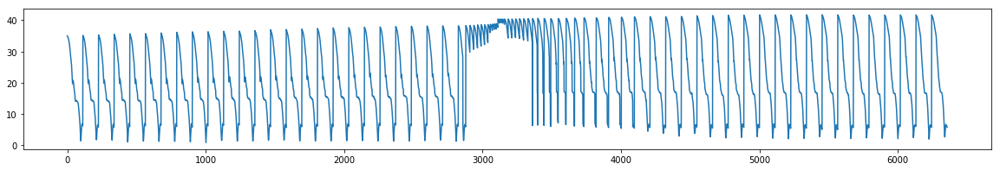

26


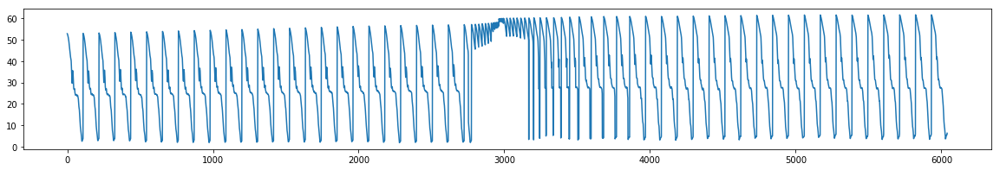

27


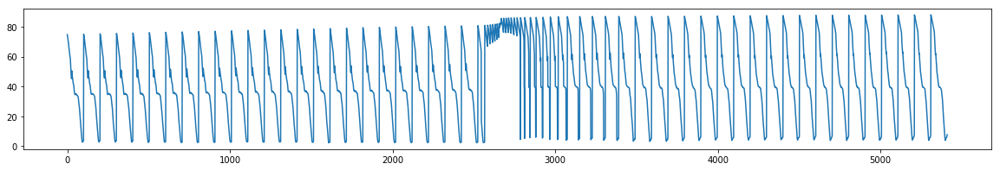

28


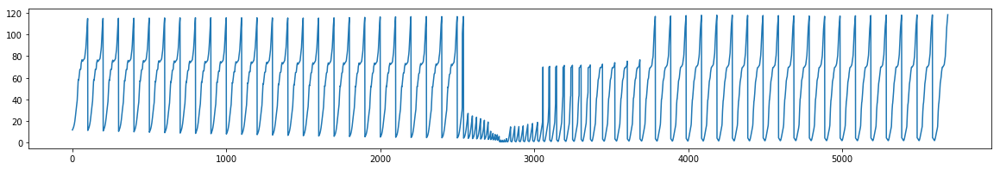

29


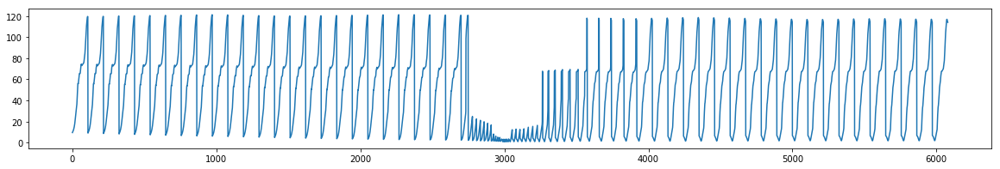

30


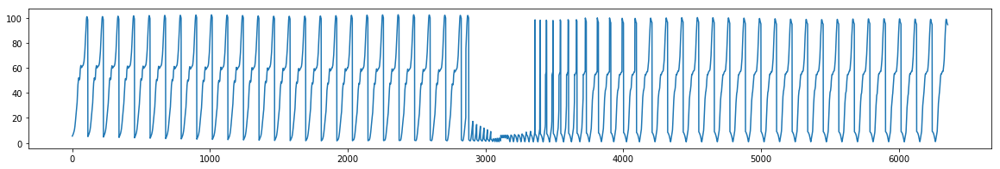

31


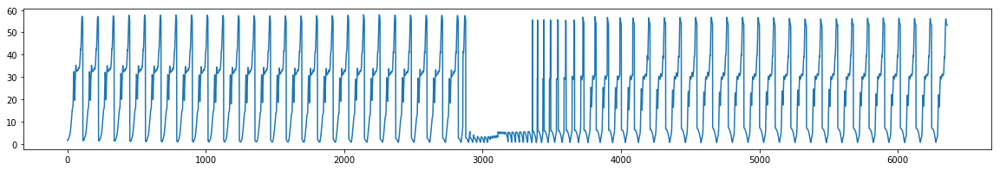

32


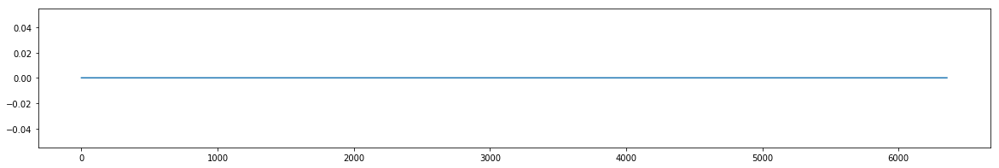

33


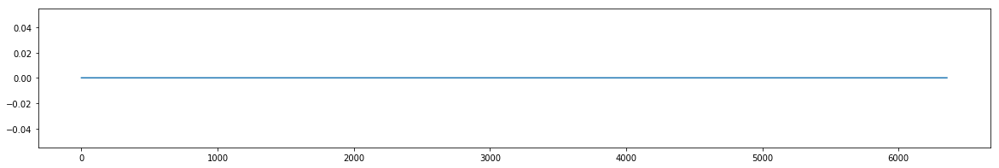

34


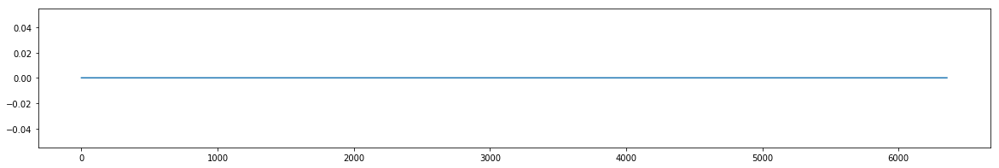

35


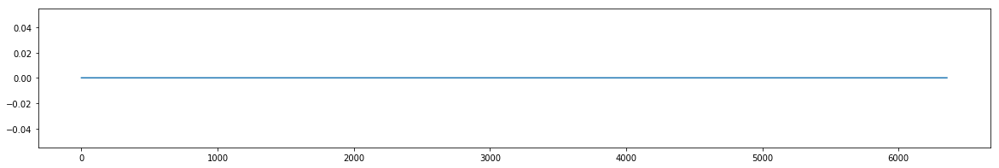

36


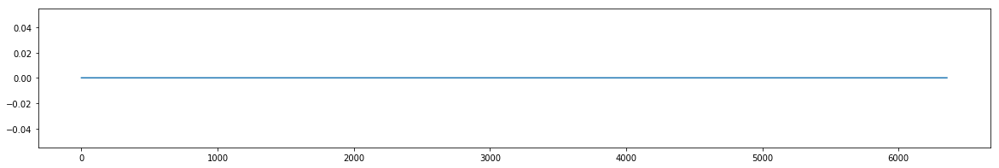

37


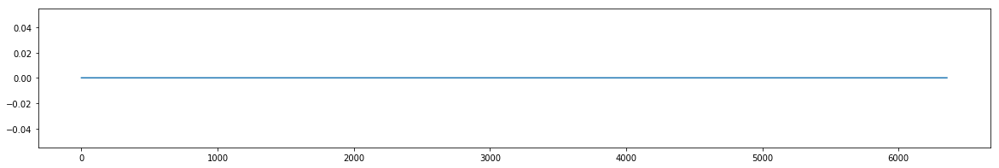

38


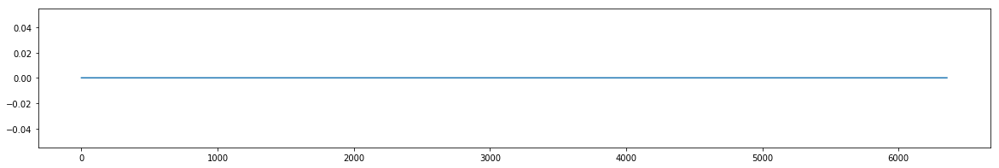

39


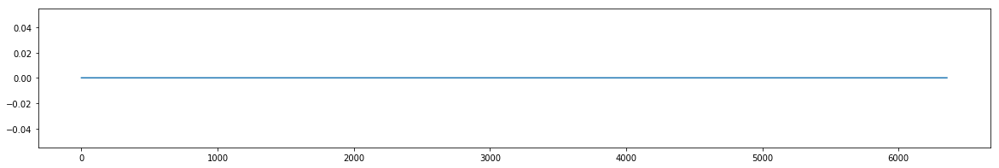

40


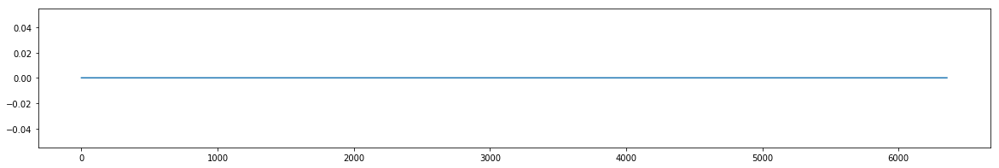

41


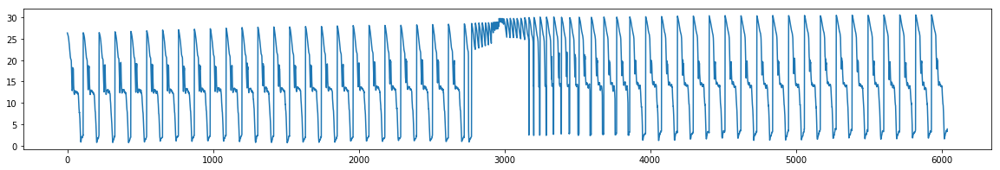

42


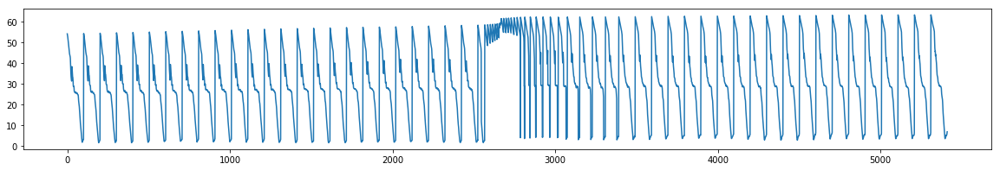

43


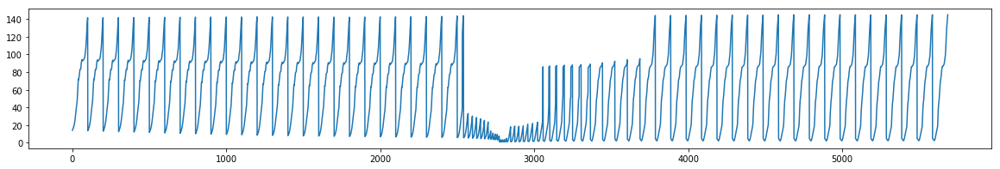

44


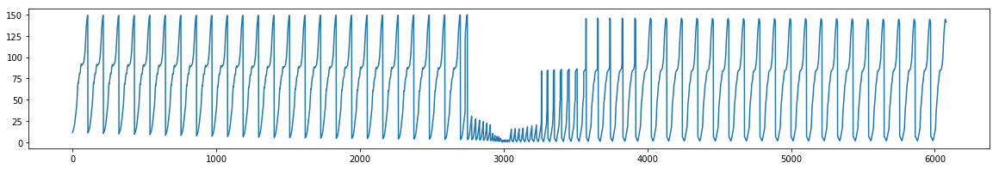

45


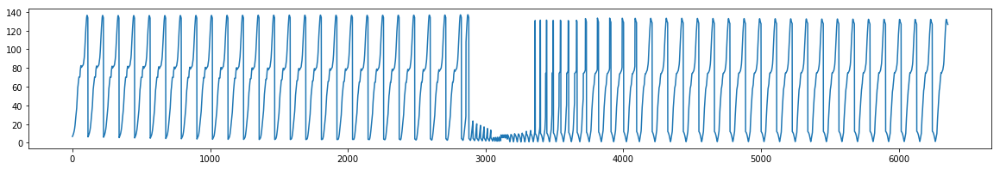

46


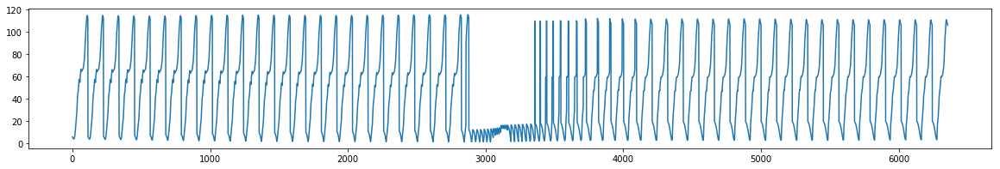

47


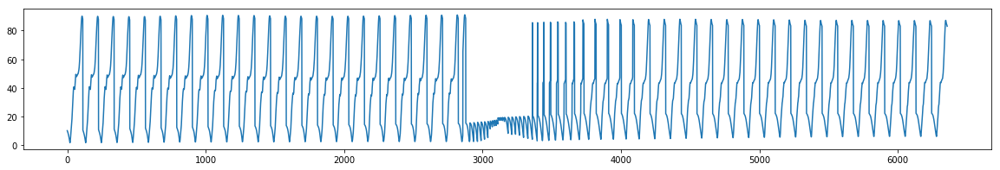

48


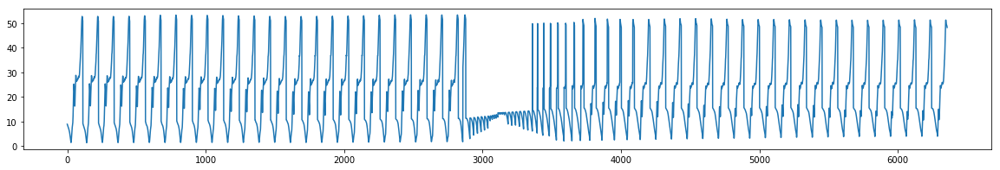

49


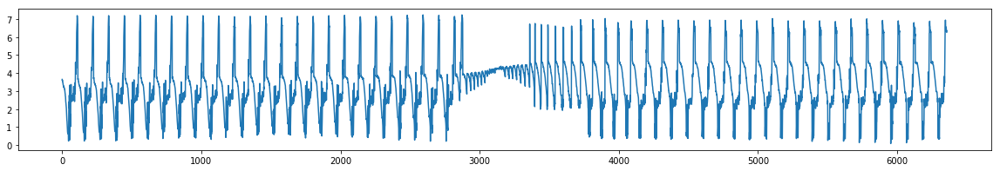

50


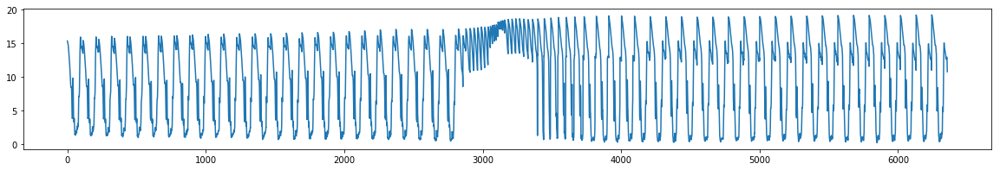

51


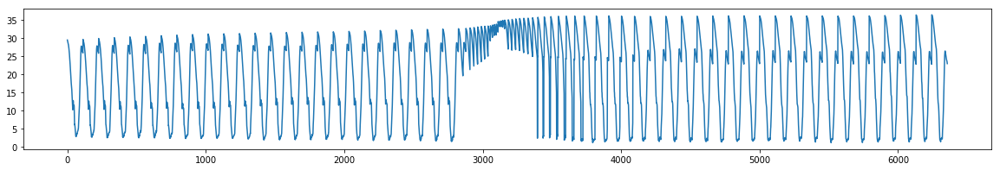

52


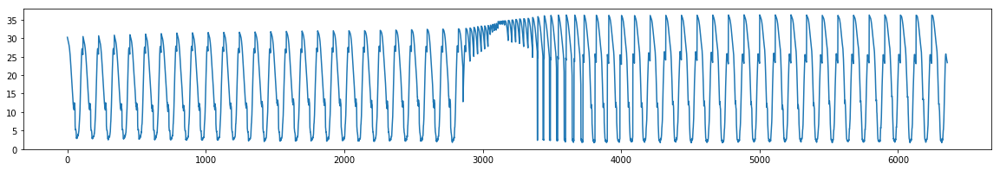

53


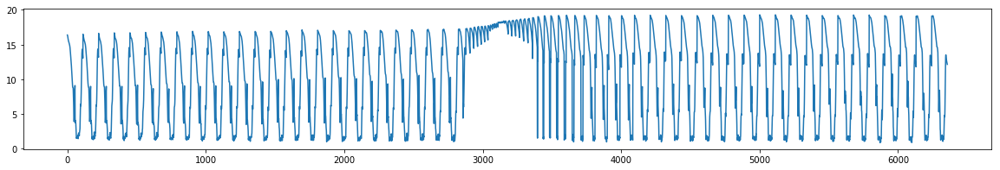

54


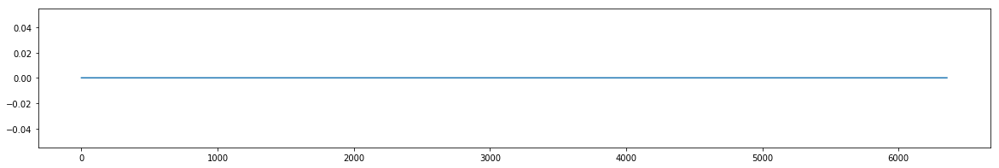

55


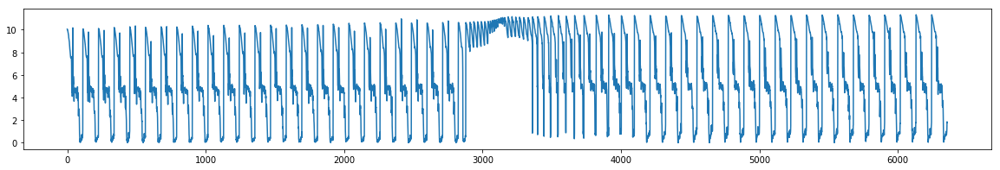

56


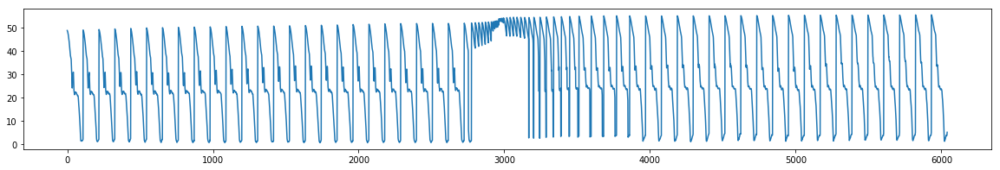

57


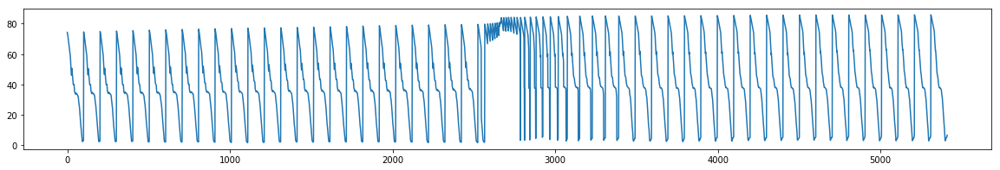

58


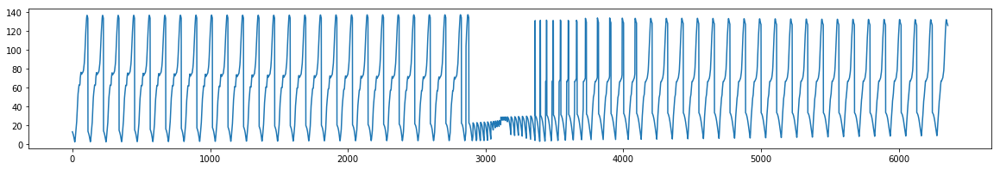

59


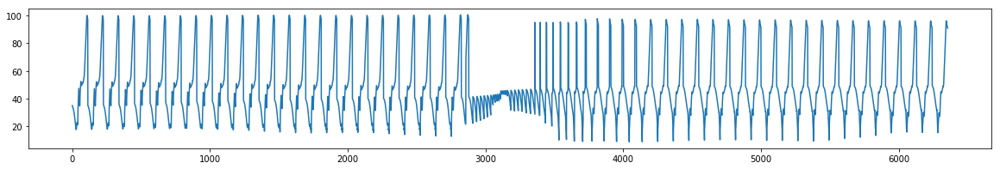

60


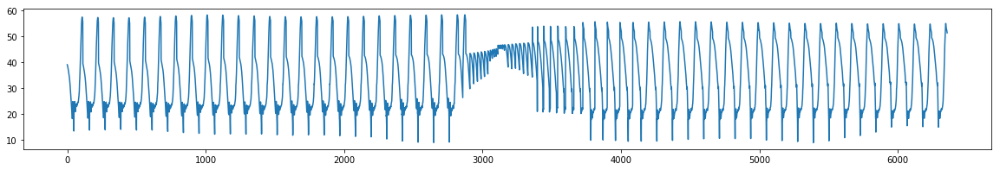

61


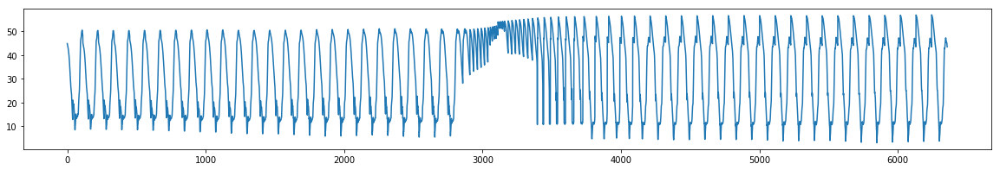

62


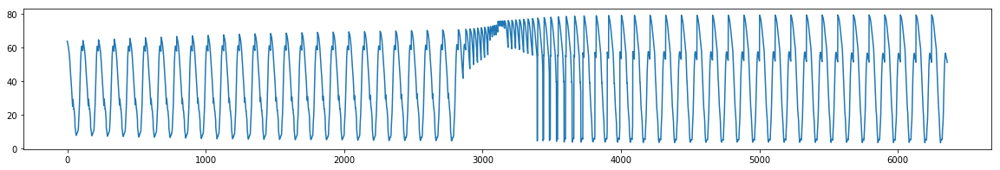

63


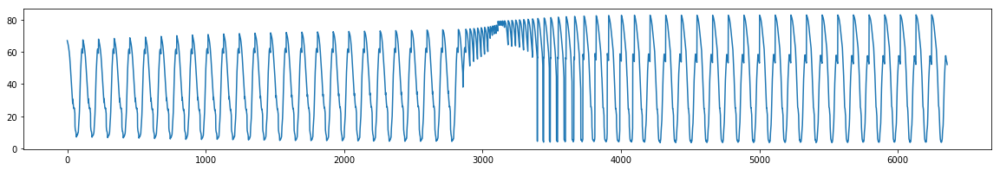

64


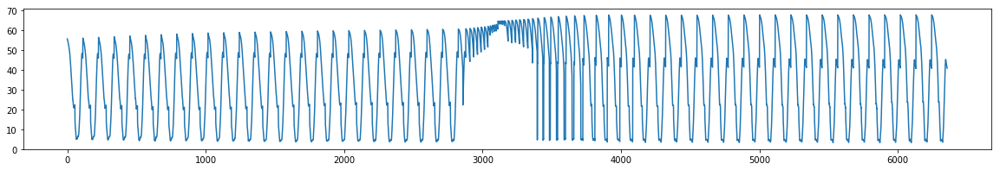

65


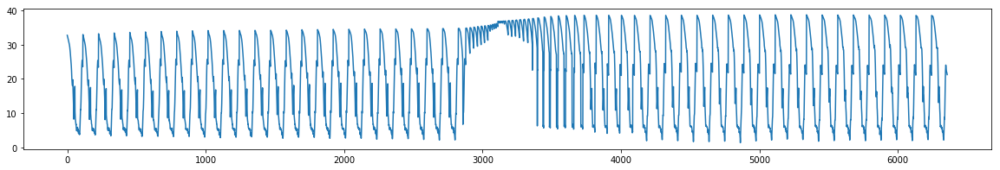

66


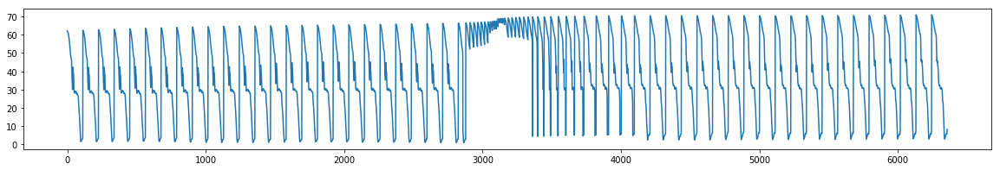

67


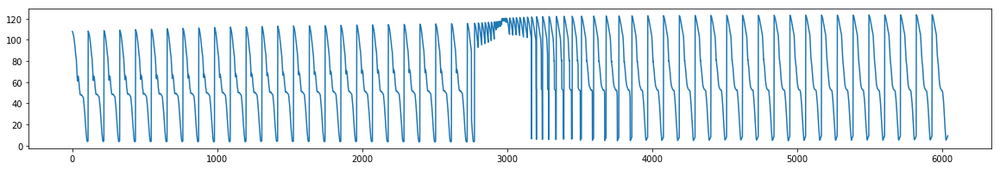

68


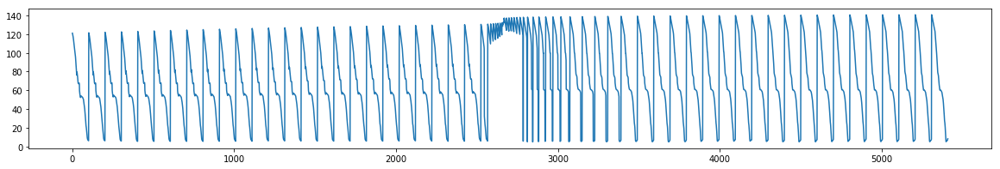

69


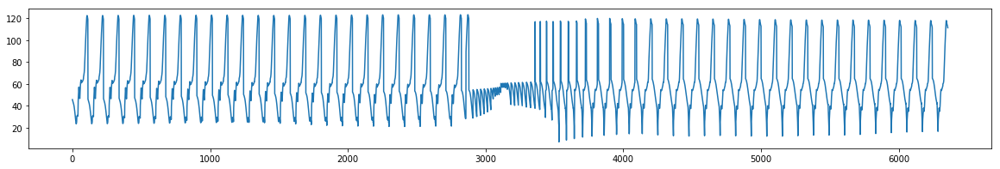

70


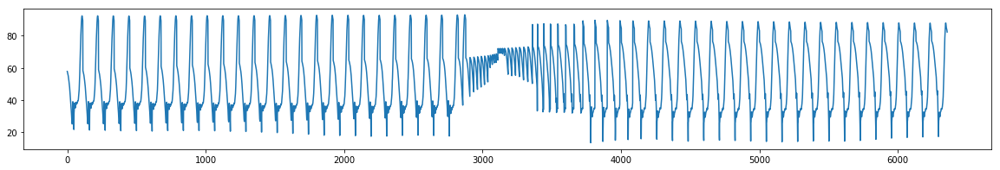

71


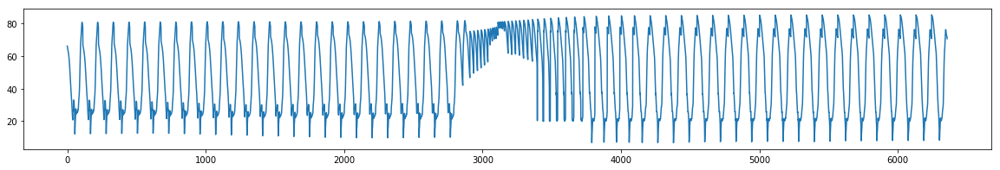

72


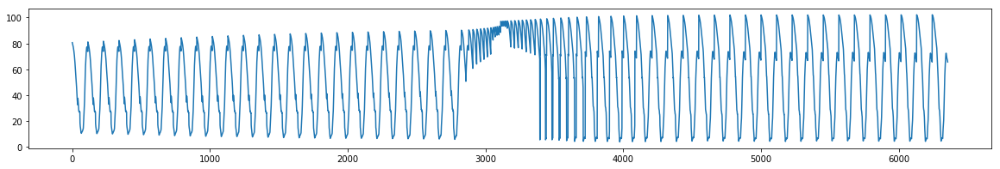

73


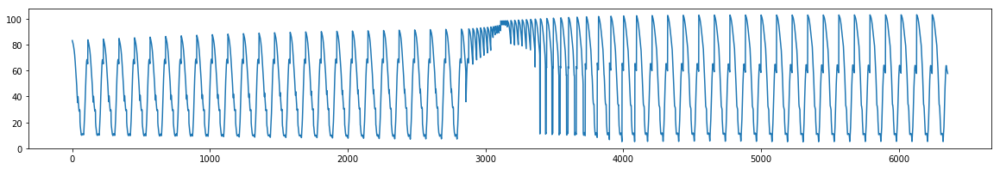

74


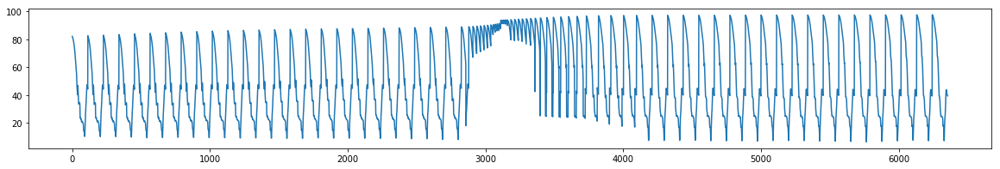

75


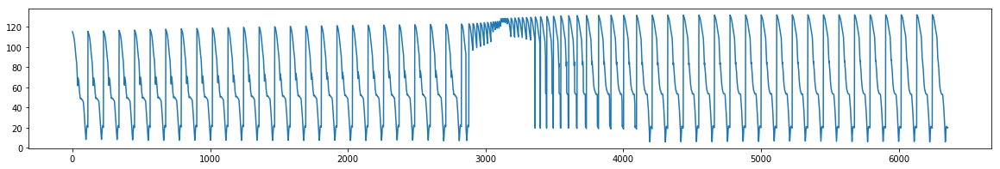

76


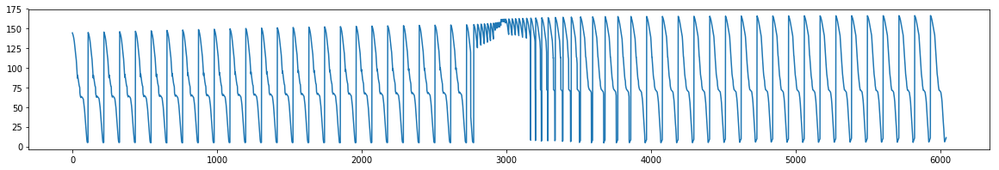

77


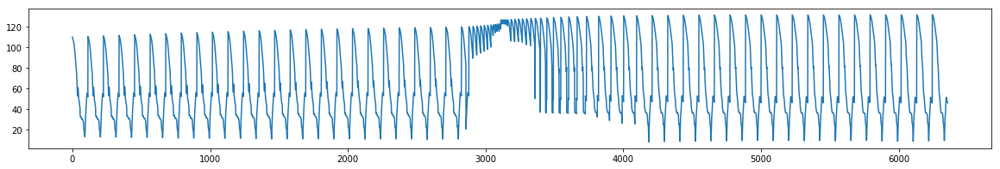

78


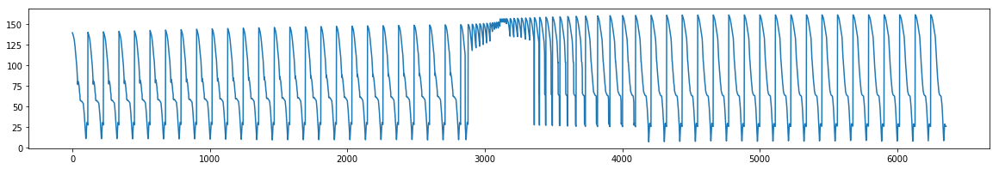

In [37]:
counter = 1
plt.rcParams["figure.figsize"] = (20,3)
for key in nodes_rgb.keys():
    print(counter)
    plt.plot(nodes_rgb[key].differences.values())
#     plt.xlim((2800,3400))
#     plt.ylim((0,0.6))
    plt.show()
    counter += 1

In [25]:
thresh_uncertainty = 40/250.
print(thresh_uncertainty)

thresh_uncertainty1 = 60/250.
print(thresh_uncertainty1)

0.16
0.24


In [36]:
node13 = nodes_descr_storedhalves[4520]

In [41]:
np.median(sorted(node13.differences.values())[:10])

0.1118968995171051

In [38]:
node13.differences

{0: 0.31714839454917054,
 1: 0.3924136963254047,
 2: 0.39601228575444786,
 3: 0.397967746484378,
 4: 0.39787642454330785,
 5: 0.39781014753486243,
 6: 0.39792531900051586,
 7: 0.3980453305151735,
 8: 0.3981772926606028,
 9: 0.3982927755900995,
 10: 0.39836033053537406,
 11: 0.39841516209155736,
 12: 0.39840808066203637,
 13: 0.39860263022383025,
 14: 0.3989192392389736,
 15: 0.3991674380806202,
 16: 0.3994839651891711,
 17: 0.3999520151951533,
 18: 0.4002936887260319,
 19: 0.400516446984399,
 20: 0.4007575267065913,
 21: 0.4010600988330115,
 22: 0.40126981602471484,
 23: 0.4015584500343508,
 24: 0.40157382327825014,
 25: 0.4018379556369395,
 26: 0.4019125556105679,
 27: 0.4017832346623377,
 28: 0.4016512491910928,
 29: 0.40211173693602587,
 30: 0.40315941034818187,
 31: 0.4047574553096086,
 32: 0.40795033314683365,
 33: 0.4120400923627608,
 34: 0.41369837677634813,
 35: 0.41514611066113166,
 36: 0.41488741265832735,
 37: 0.4145119148297711,
 38: 0.41461338792180985,
 39: 0.418907433671

In [43]:
i = 1
for node in nodes_descr_storedhalves.values():
    print(i, "node id: ", node.node_id)

    temp_min_diff = min(node.differences.values())
    print("temp_min_diff", temp_min_diff)
    temp = np.array(list(node.differences.values())) - temp_min_diff
    node_uncertainty = len(list(filter(lambda x: x < thresh_uncertainty, temp)))
    
    node_uncertainty1 = len(list(filter(lambda x: x < thresh_uncertainty1, node.differences.values())))
    print("uncertainty: ", node_uncertainty, node_uncertainty1)
    node.priority = len(node.labels) / max(node_uncertainty, 1)
    print("in total labels: ", len(node.labels))
    print("alternative ", 1 / np.median(sorted(node.differences.values())[:10]))
    print()
    i += 1

1 node id:  3640
temp_min_diff 0.0418935437182578
uncertainty:  4825 5094
in total labels:  6357
alternative  17.832632730832486

2 node id:  3648
temp_min_diff 0.09732877954058433
uncertainty:  5247 5171
in total labels:  6357
alternative  10.163509643333413

3 node id:  3656
temp_min_diff 0.08791504570982564
uncertainty:  5658 5535
in total labels:  6357
alternative  11.110769088656127

4 node id:  3664
temp_min_diff 0.06841635978910289
uncertainty:  6167 6170
in total labels:  6357
alternative  13.748918337265827

5 node id:  3672
temp_min_diff 0.0648600920648022
uncertainty:  6167 6172
in total labels:  6357
alternative  14.66356122483579

6 node id:  3680
temp_min_diff 0.06243613870329868
uncertainty:  6144 6185
in total labels:  6357
alternative  15.150443648556386

7 node id:  3688
temp_min_diff 0.06205574698242708
uncertainty:  6143 6190
in total labels:  6357
alternative  15.159487203675766

8 node id:  3696
temp_min_diff 0.1263161017831176
uncertainty:  6251 6056
in total lab

/home/niaki/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: divide by zero encountered in double_scalars
  


uncertainty:  6357 6357
in total labels:  6357
alternative  inf

33 node id:  5464
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

34 node id:  5472
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

35 node id:  5480
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

36 node id:  5488
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

37 node id:  5496
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

38 node id:  5504
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

39 node id:  5512
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

40 node id:  5520
temp_min_diff 0
uncertainty:  6357 6357
in total labels:  6357
alternative  inf

41 node id:  5528
temp_min_diff 0.22560112980742927
uncertainty:  5997 1442
in total labels:  6041
alternative  4.423100670109775

42 node id: 

1


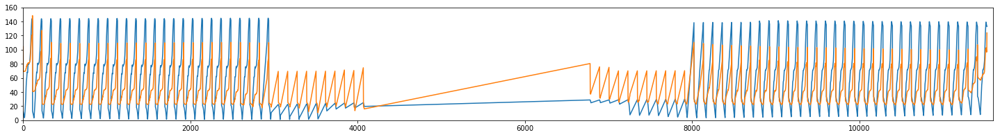

2


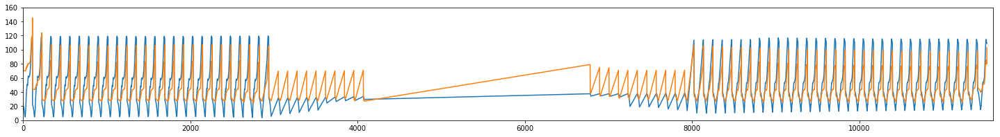

3


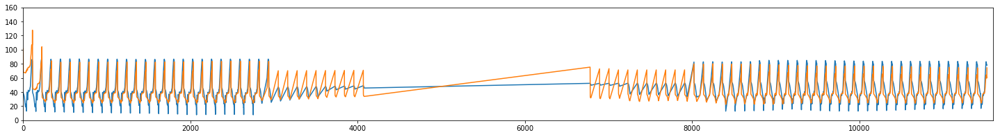

4


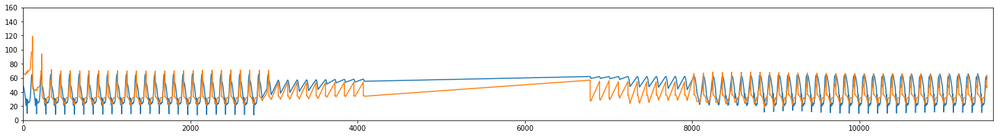

5


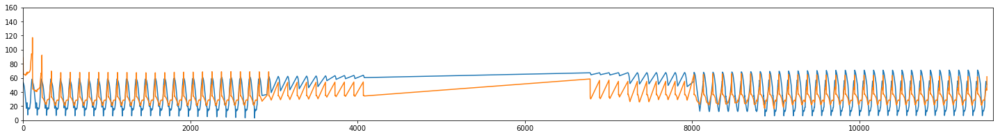

6


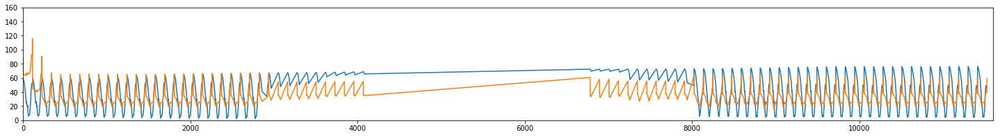

7


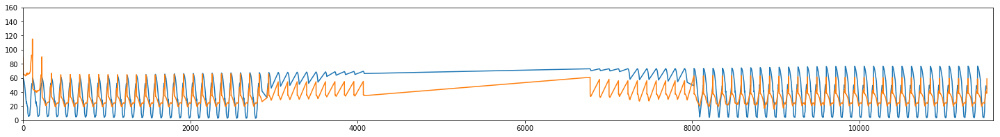

8


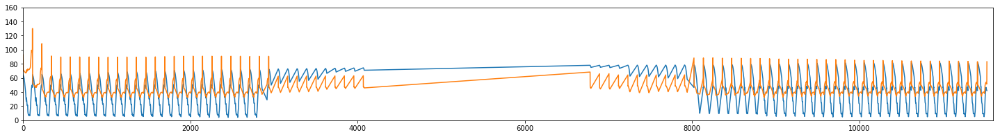

9


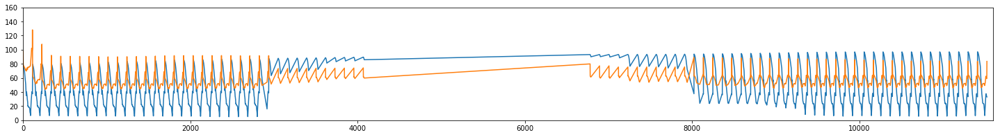

10


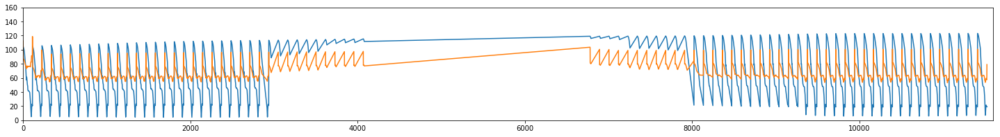

11


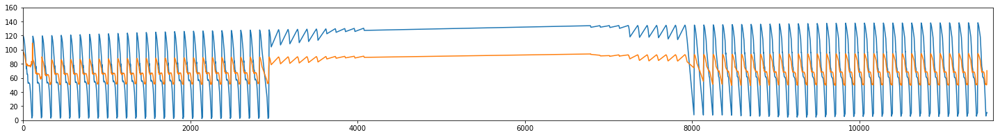

12


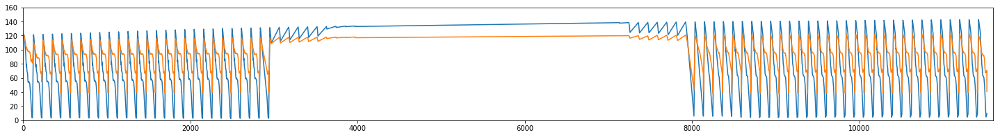

13


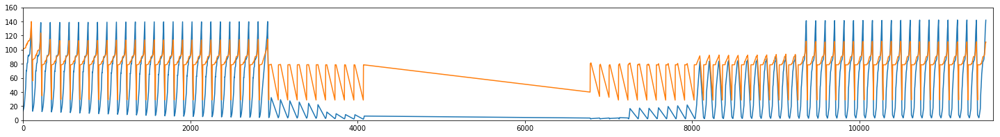

14


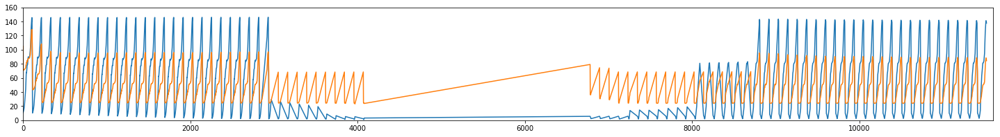

15


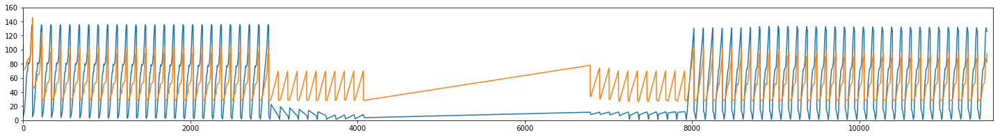

16


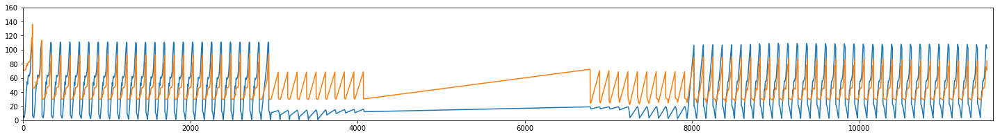

17


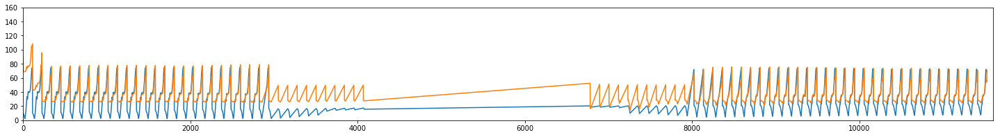

18


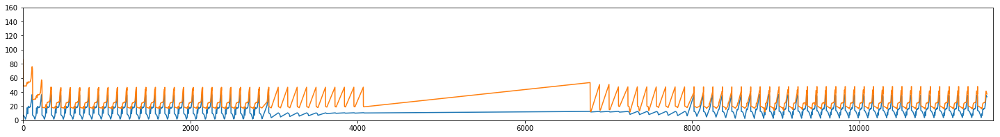

19


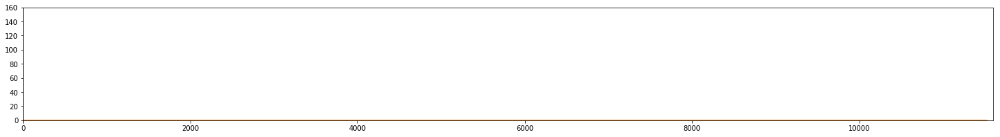

20


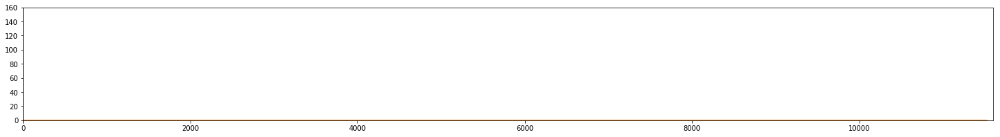

21


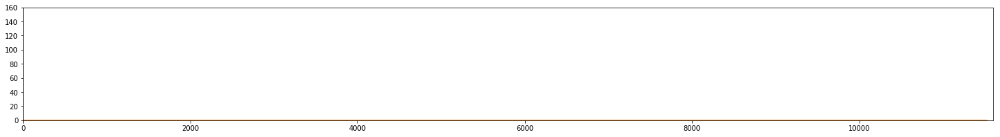

22


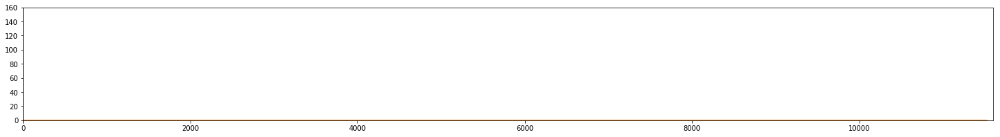

23


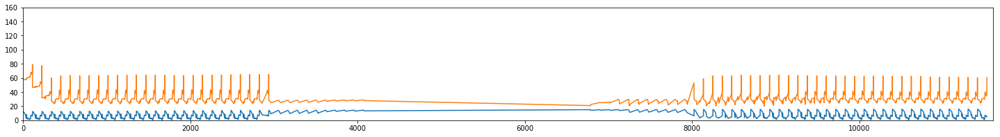

24


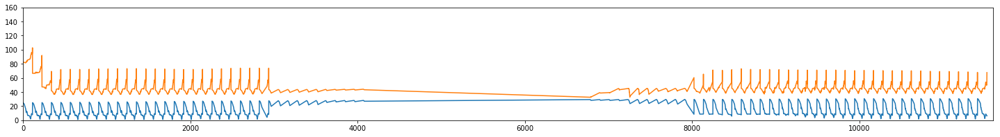

25


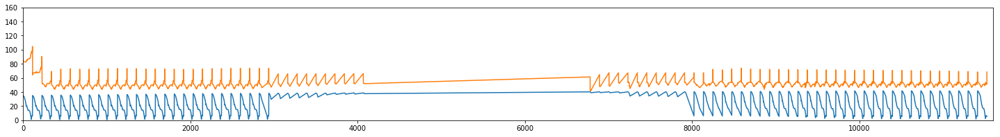

26


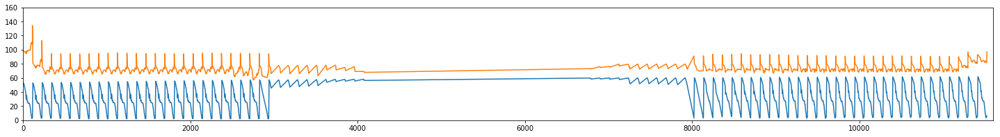

27


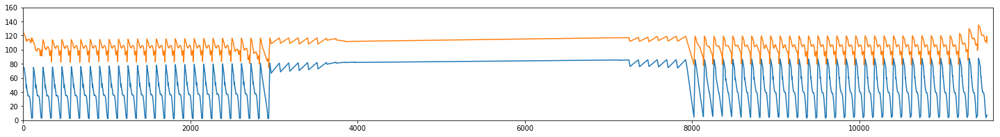

28


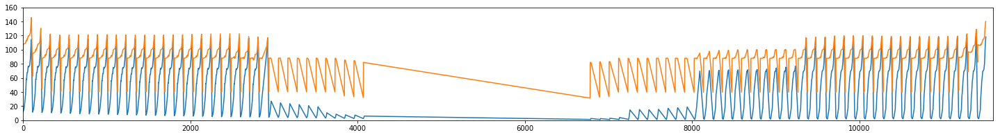

29


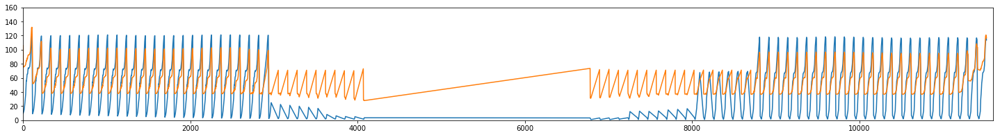

30


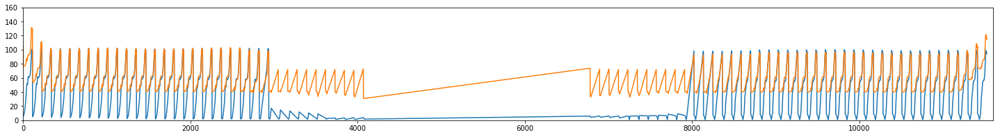

31


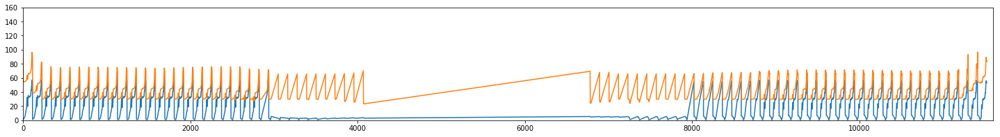

32


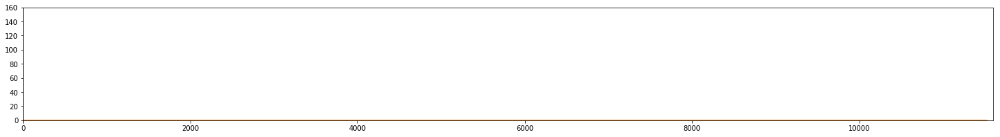

33


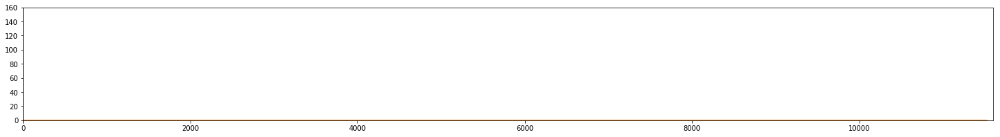

34


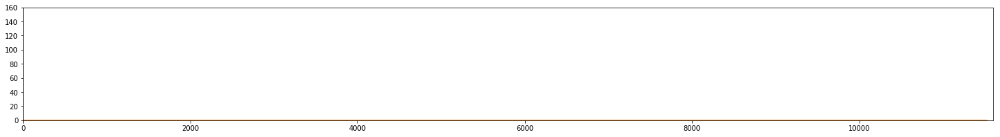

35


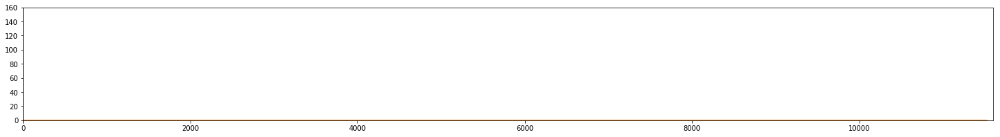

36


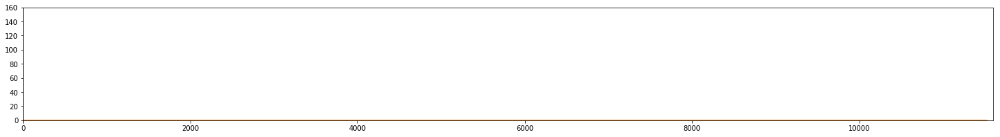

37


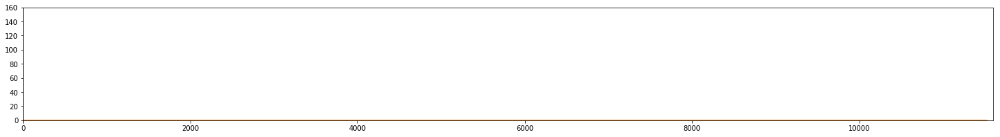

38


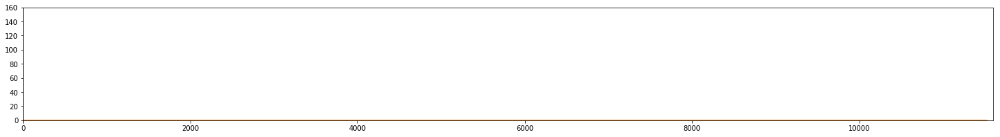

39


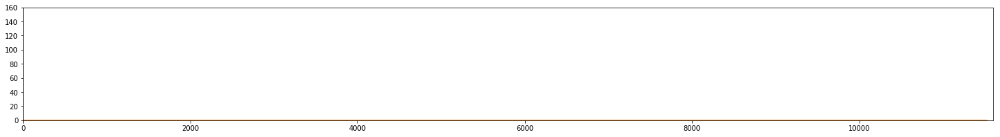

40


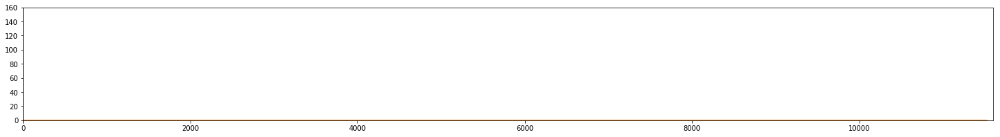

41


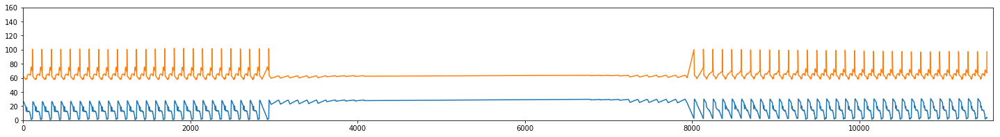

42


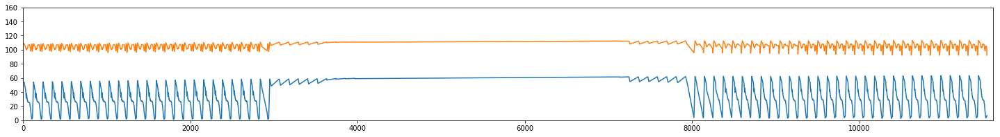

43


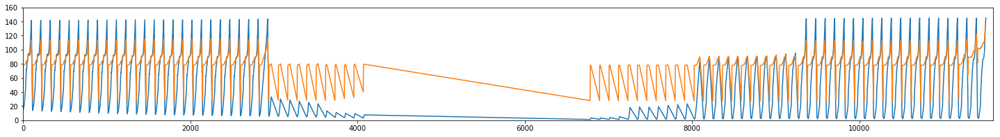

44


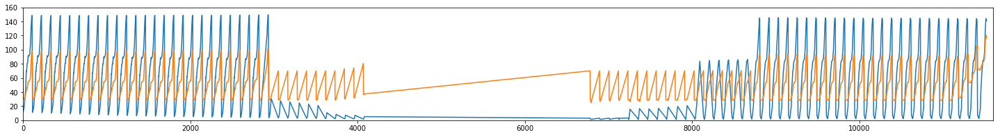

45


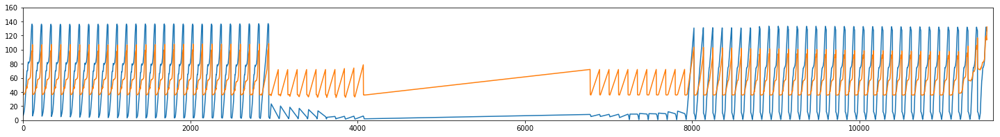

46


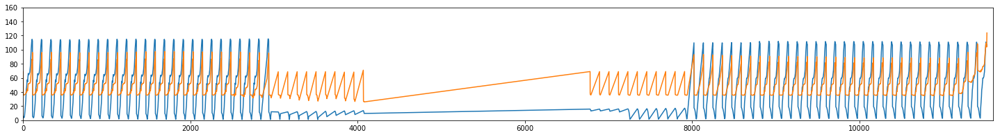

47


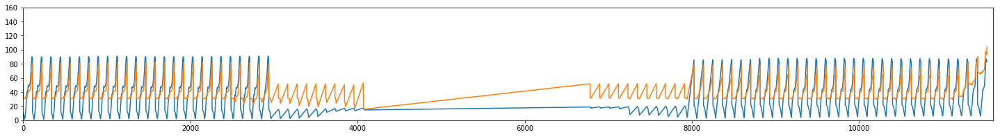

48


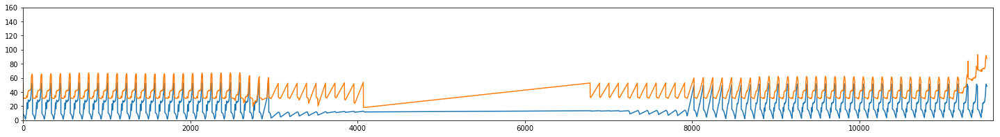

49


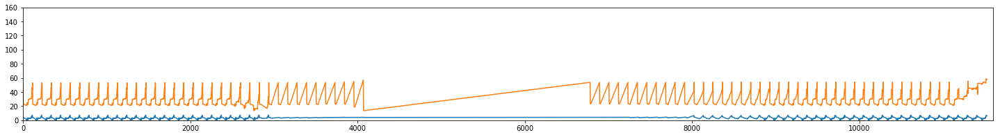

50


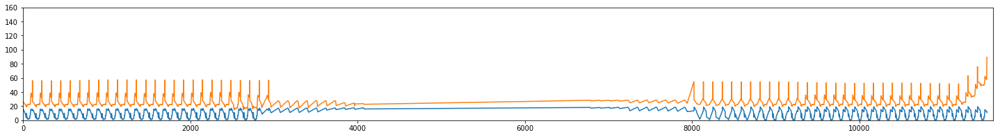

51


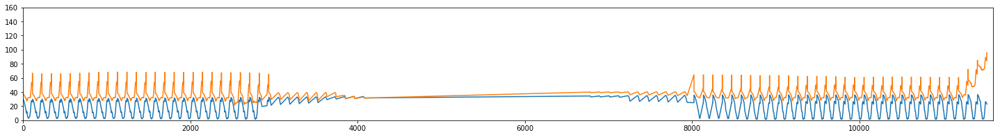

52


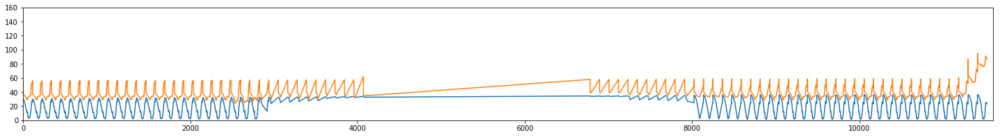

53


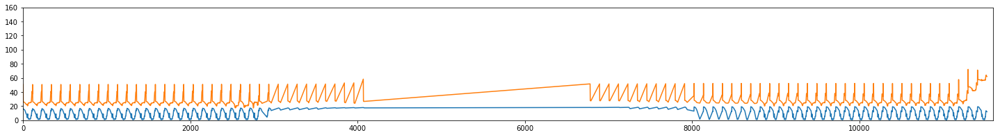

54


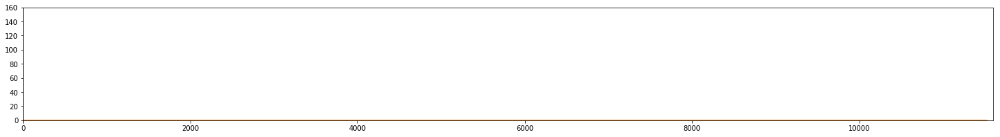

55


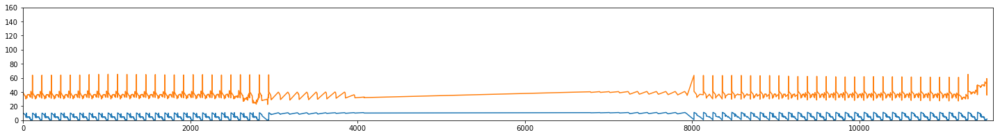

56


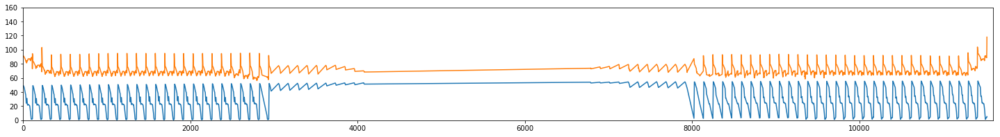

57


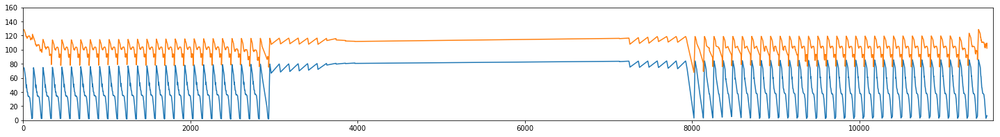

58


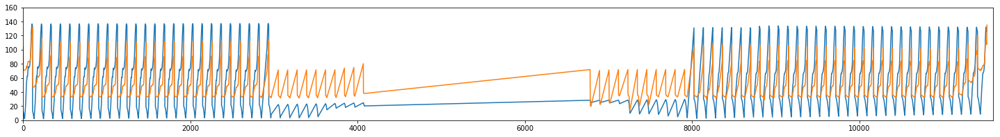

59


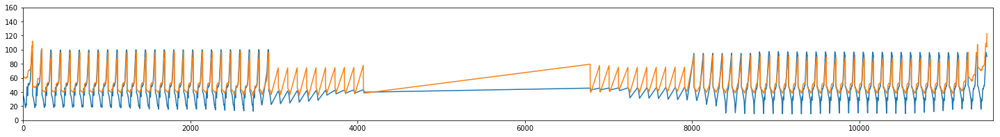

60


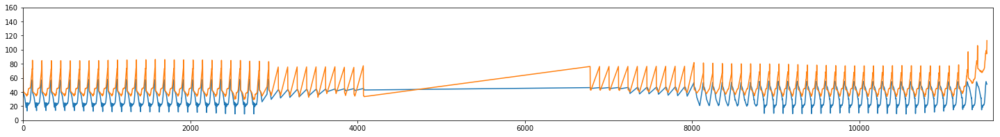

61


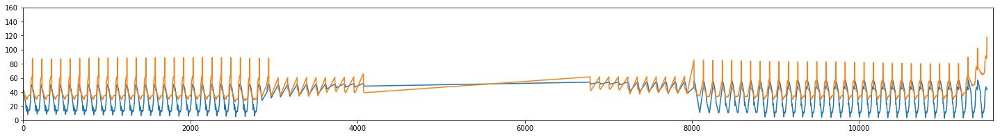

62


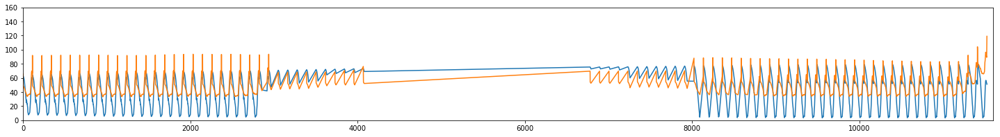

63


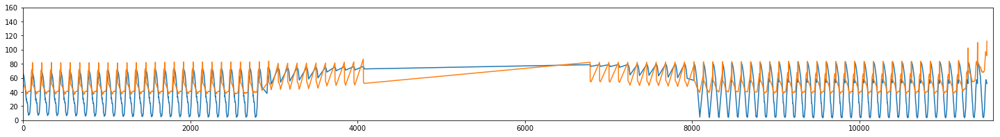

64


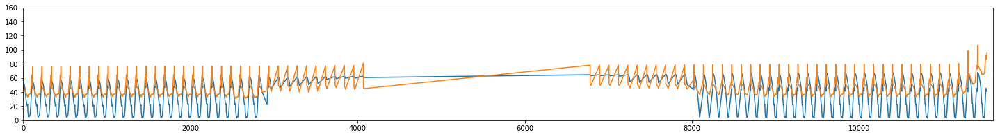

65


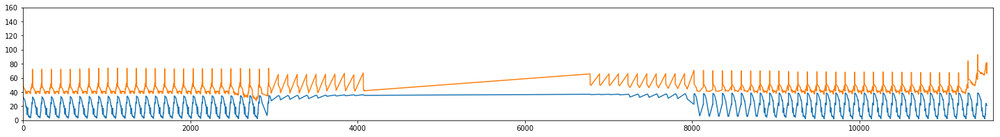

66


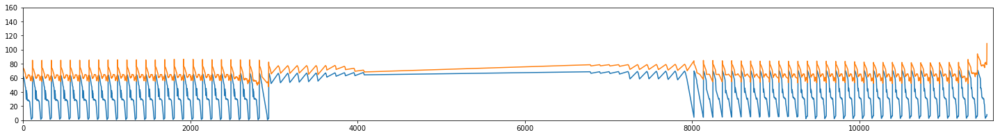

67


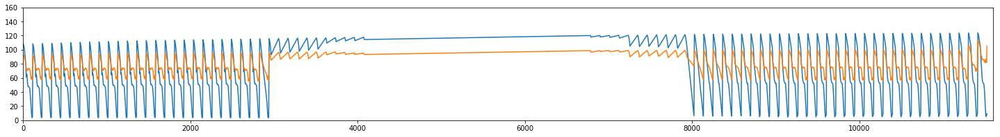

68


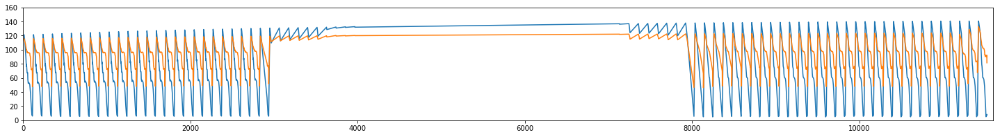

69


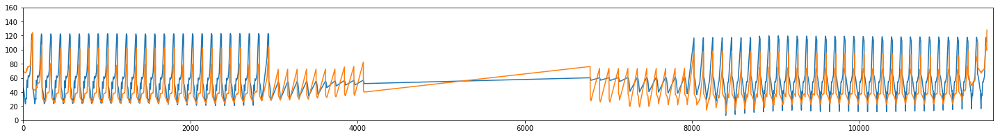

70


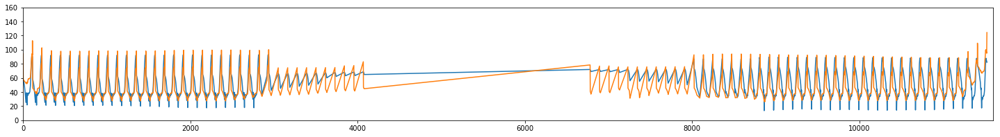

71


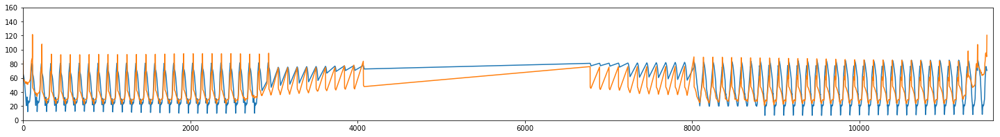

72


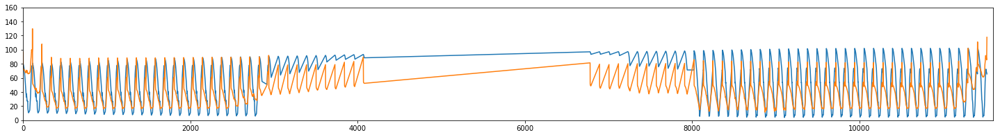

73


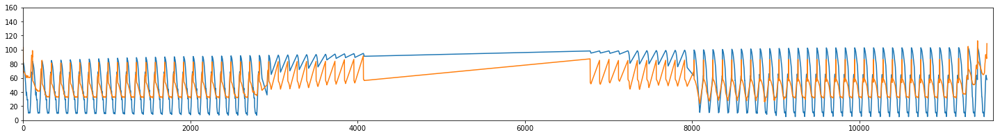

74


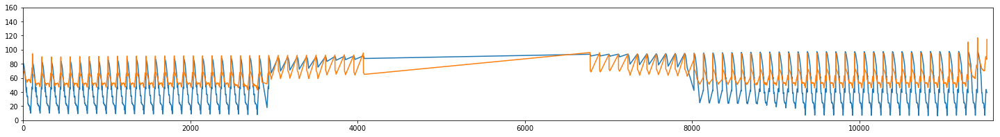

75


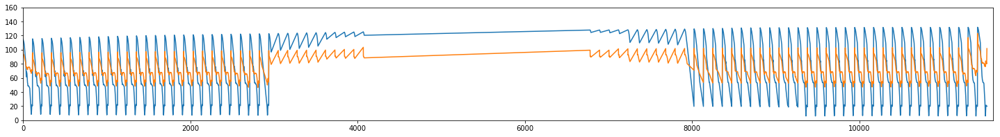

76


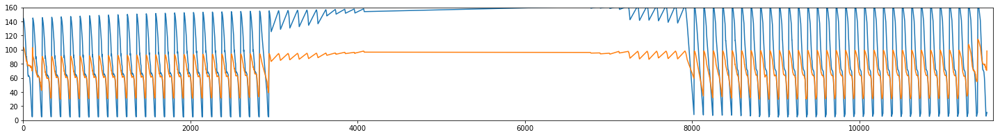

77


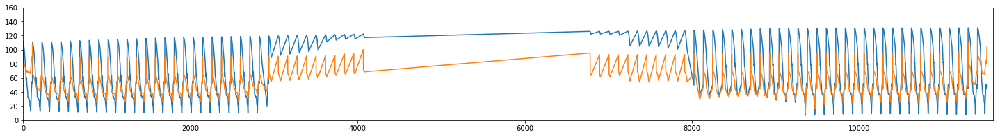

78


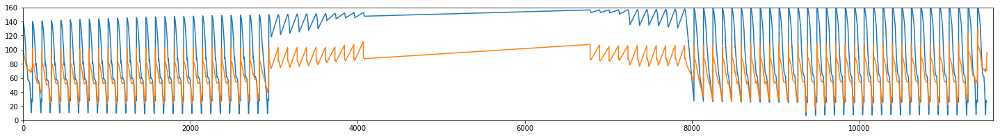

In [103]:
counter = 1
plt.rcParams["figure.figsize"] = (25,3)
for key in nodes_rgb.keys():
    print(counter)
    
#     y1 = np.zeros(11600)
#     for i in range(11600):
#         y1[i] = nodes_rgb[key].differences.get(i, 200)
#     plt.plot(y1)
    
#     y2 = np.zeros(11600)
#     for i in range(11600):
#         y2[i] = nodes_descr_storedhalves[key].differences.get(i, 0.8) * 255
#     plt.plot(y2)
      
    lists1 = sorted(nodes_rgb[key].differences.items()) # sorted by key, return a list of tuples
    x1, y1 = zip(*lists1)
    plt.plot(x1, y1)
    
    lists2 = sorted(nodes_descr_storedhalves[key].differences.items()) # sorted by key, return a list of tuples
    x2, y2 = zip(*lists2)
    y2 = np.array(y2) * 255
    plt.plot(x2, y2)
    
#     plt.plot(nodes_rgb[key].differences.values(), label='rgb') #blue
#     plt.plot(np.array(list(nodes_descr_storedhalves[key].differences.values()))*255, label='descr') #orange

#     plt.xlim((6500,8200))
    plt.xlim((0,11600))
    plt.ylim((0, 160))
#     plt.legend()
    plt.show()
    counter += 1

In [64]:
nodes_descr_storedhalves.keys()

dict_keys([3640, 3648, 3656, 3664, 3672, 3680, 3688, 3696, 3704, 3712, 3720, 3728, 4520, 4528, 4536, 4544, 4552, 4560, 4568, 4576, 4584, 4592, 4600, 4608, 4616, 4624, 4632, 5424, 5432, 5440, 5448, 5456, 5464, 5472, 5480, 5488, 5496, 5504, 5512, 5520, 5528, 5536, 6328, 6336, 6344, 6352, 6360, 6368, 6376, 6384, 6392, 6400, 6408, 6416, 6424, 6432, 6440, 7264, 7272, 7280, 7288, 7296, 7304, 7312, 7320, 7328, 7336, 7344, 8176, 8184, 8192, 8200, 8216, 8224, 8232, 8240, 9128, 9136])

In [94]:
for key in nodes_descr_storedhalves[9136].differences.keys():
    print(key, end=' ')

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 27

9234 9254 9255 9256 9257 9258 9259 9260 9261 9262 9263 9264 9265 9266 9267 9268 9269 9270 9271 9272 9273 9274 9275 9276 9277 9278 9279 9280 9281 9282 9283 9284 9285 9286 9287 9288 9289 9290 9291 9292 9293 9294 9295 9296 9297 9298 9299 9300 9301 9302 9303 9304 9305 9306 9307 9308 9309 9310 9311 9312 9313 9314 9315 9316 9317 9318 9319 9320 9321 9322 9323 9324 9325 9326 9327 9328 9329 9330 9331 9332 9333 9334 9335 9336 9337 9338 9339 9340 9341 9342 9343 9344 9345 9346 9347 9348 9349 9350 9351 9352 9353 9354 9355 9356 9357 9358 9359 9360 9361 9362 9363 9364 9365 9366 9367 9368 9369 9370 9371 9372 9373 9374 9375 9376 9377 9378 9379 9380 9381 9382 9383 9384 9385 9386 9387 9388 9389 9390 9391 9392 9393 9394 9395 9396 9397 9398 9399 9400 9401 9402 9403 9404 9405 9406 9407 9408 9409 9410 9411 9412 9413 9414 9415 9416 9417 9418 9419 9420 9421 9422 9423 9424 9425 9426 9427 9428 9429 9430 9431 9432 9433 9434 9435 9436 9437 9438 9439 9440 9441 9442 9443 9444 9445 9446 9447 9448 9449 9450 9451 9452 

In [89]:
for key in nodes_descr_storedhalves[3640].differences.keys():
    print(key, end=' ')

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 27

 8772 8773 8774 8775 8776 8777 8778 8806 8807 8808 8809 8810 8811 8812 8813 8814 8815 8816 8817 8818 8819 8820 8821 8822 8823 8824 8825 8826 8827 8828 8829 8830 8831 8832 8833 8834 8835 8836 8837 8838 8839 8840 8841 8842 8843 8844 8845 8846 8847 8848 8849 8850 8851 8852 8853 8854 8855 8856 8857 8858 8859 8860 8861 8862 8863 8864 8865 8866 8867 8868 8869 8870 8871 8872 8873 8874 8875 8876 8877 8878 8879 8880 8881 8882 8883 8884 8885 8886 8887 8888 8889 8890 8891 8892 8918 8919 8920 8921 8922 8923 8924 8925 8926 8927 8928 8929 8930 8931 8932 8933 8934 8935 8936 8937 8938 8939 8940 8941 8942 8943 8944 8945 8946 8947 8948 8949 8950 8951 8952 8953 8954 8955 8956 8957 8958 8959 8960 8961 8962 8963 8964 8965 8966 8967 8968 8969 8970 8971 8972 8973 8974 8975 8976 8977 8978 8979 8980 8981 8982 8983 8984 8985 8986 8987 8988 8989 8990 8991 8992 8993 8994 8995 8996 8997 8998 8999 9000 9001 9002 9003 9004 9005 9006 9030 9031 9032 9033 9034 9035 9036 9037 9038 9039 9040 9041 9042 9043 9044 9045 9046

In [81]:
for i in range(6357):
    print(i, nodes_descr_storedhalves[3640].differences.get(i))

0 0.4096622125893911
1 0.3061432311580737
2 0.2837863715188706
3 0.27133000508179894
4 0.2712051844635421
5 0.27110688641925795
6 0.2711395963625728
7 0.271250879139218
8 0.27134329491623577
9 0.271375575163354
10 0.27133533674041255
11 0.27129946678992095
12 0.2711206726592087
13 0.2711442747750675
14 0.2713406578842582
15 0.2714107842559032
16 0.2716676198736669
17 0.27209109915800844
18 0.27241821988261
19 0.2726046381036003
20 0.27265176262252155
21 0.27293901006499355
22 0.27306052459807484
23 0.2731902649465092
24 0.27319709840648504
25 0.27343601298560316
26 0.27356029537888493
27 0.27371775066401377
28 0.27372563183330656
29 0.2743545099557665
30 0.27592712731151386
31 0.2775199719080779
32 0.2810730001383151
33 0.2854589426582298
34 0.287081261750939
35 0.2887034724796845
36 0.2883835636034051
37 0.28796428523909456
38 0.2881102374945324
39 0.2946391796098638
40 0.2970233616280942
41 0.30178705619147567
42 0.30265864719499314
43 0.30201497377711756
44 0.2995809629938361
45 0.3

1821 0.09015542443083645
1822 0.08952156617591814
1823 0.0891091136837207
1824 0.08865028706371941
1825 0.0881318788946879
1826 0.08785257212133966
1827 0.0877278932844673
1828 0.08779734148279432
1829 0.0875300509529208
1830 0.08764135373061134
1831 0.08789357770202637
1832 0.08826095183595499
1833 0.08838033815941089
1834 0.0888546857333535
1835 0.08974236616950837
1836 0.09055403154321447
1837 0.09132470033886379
1838 0.0920876333699676
1839 0.09156964044298901
1840 0.09291937696752514
1841 0.09560765202973495
1842 0.09820278549540021
1843 0.10021388882066062
1844 0.10240707060077639
1845 0.10656868467635337
1846 0.10820030571304864
1847 0.11286805011161613
1848 0.10740531053090226
1849 0.11100980031546034
1850 0.11435839039248766
1851 0.11580839836148986
1852 0.1171796720500483
1853 0.11944804090899386
1854 0.12107620312484453
1855 0.1282777361203314
1856 0.12549181934006634
1857 0.13327823483177548
1858 0.1346129969937866
1859 0.13481942913265182
1860 0.1371068572651139
1861 0.138

3352 None
3353 None
3354 None
3355 None
3356 None
3357 None
3358 None
3359 None
3360 None
3361 None
3362 None
3363 None
3364 None
3365 None
3366 None
3367 None
3368 None
3369 None
3370 None
3371 None
3372 None
3373 None
3374 None
3375 None
3376 None
3377 None
3378 None
3379 None
3380 None
3381 None
3382 None
3383 None
3384 None
3385 None
3386 None
3387 None
3388 None
3389 None
3390 0.27271644505863435
3391 0.12266916896333849
3392 0.10460436973920235
3393 0.09785691689825204
3394 0.0974759769596664
3395 0.09716136148029055
3396 0.09672922688040266
3397 0.09629650852756624
3398 0.09576313083994233
3399 0.09517023790706822
3400 0.09443387652438741
3401 0.09382548450889697
3402 0.09326857862984209
3403 0.0926513434954708
3404 0.09198282521535449
3405 0.08973105647308134
3406 0.08818347530110647
3407 0.08394320843131196
3408 0.07921671347219886
3409 0.07401141910639401
3410 0.06771750352092923
3411 0.06439012040107024
3412 0.06126909048144905
3413 0.05570453176365672
3414 0.047859912973159

5247 None
5248 None
5249 None
5250 None
5251 None
5252 None
5253 None
5254 None
5255 None
5256 None
5257 None
5258 None
5259 None
5260 None
5261 None
5262 None
5263 None
5264 None
5265 None
5266 None
5267 None
5268 None
5269 None
5270 None
5271 None
5272 None
5273 None
5274 None
5275 None
5276 None
5277 None
5278 None
5279 None
5280 None
5281 None
5282 None
5283 None
5284 None
5285 None
5286 None
5287 None
5288 None
5289 None
5290 None
5291 None
5292 None
5293 None
5294 None
5295 None
5296 None
5297 None
5298 None
5299 None
5300 None
5301 None
5302 None
5303 None
5304 None
5305 None
5306 None
5307 None
5308 None
5309 None
5310 None
5311 None
5312 None
5313 None
5314 None
5315 None
5316 None
5317 None
5318 None
5319 None
5320 None
5321 None
5322 None
5323 None
5324 None
5325 None
5326 None
5327 None
5328 None
5329 None
5330 None
5331 None
5332 None
5333 None
5334 None
5335 None
5336 None
5337 None
5338 None
5339 None
5340 None
5341 None
5342 None
5343 None
5344 None
5345 None
5346 None


In [44]:
myList = [0.0, 0.0, 0.0, 2.0, 2.0]
myList2 = [0.0, 0.0]

In [50]:
next((i for i, x in enumerate(myList) if x), None)    # 3

3

In [53]:
next((i for i, x in enumerate(myList2) if x), None)   # None

NoneType